<a href="https://colab.research.google.com/github/ali-benny/CalcoloNumerico/blob/main/Copia_di_ProgettoCompletoCalcolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deblur Immagini
Il problema di deblur consiste nella ricostruzione di un immagine a partire da un dato acquisito mediante il seguente modello:

\begin{align*}
    b = A x + \eta
\end{align*}

dove $b$ rappresenta l'immagine corrotta, $x$ l'immagine originale che vogliamo ricostruire, $A$ l'operatore che applica il blur Gaussiano ed $\eta$ il rumore additivo con distribuzione Gaussiana di  media $\mathbb{0}$ e deviazione standard $\sigma$.

## Funzioni di blur
Le seguenti funzioni servono per applicare il blur di tipo gaussiano ad un'immagine.



In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft

# Create a Gaussian kernel of size kernlen and standard deviation sigma
def gaussian_kernel(kernlen, sigma):
    x = np.linspace(- (kernlen // 2), kernlen // 2, kernlen)    
    # Unidimensional Gaussian kernel
    kern1d = np.exp(- 0.5 * (x**2 / sigma))
    # Bidimensional Gaussian kernel
    kern2d = np.outer(kern1d, kern1d)
    # Normalization
    return kern2d / kern2d.sum()

# Compute the FFT of the kernel 'K' of size 'd' padding with the zeros necessary
# to match the size of 'shape'
def psf_fft(K, d, shape):
    # Zero padding
    K_p = np.zeros(shape)
    K_p[:d, :d] = K

    # Shift
    p = d // 2
    K_pr = np.roll(np.roll(K_p, -p, 0), -p, 1)

    # Compute FFT
    K_otf = fft.fft2(K_pr)
    return K_otf

# Multiplication by A
def A(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(K * x))

# Multiplication by A transpose
def AT(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(np.conj(K) * x))

## Generazione dataset
Generare un set di 8 immagini 512$\times$512 in formato ${\tt png}$ in scala dei grigi che contengano tra i 2 ed i 6 oggetti geometrici, di colore uniforme, su sfondo nero. 


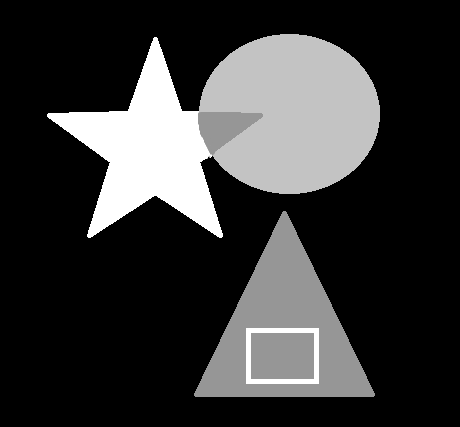


Text(0.5, 1.0, 'Immagine Originale giornale')

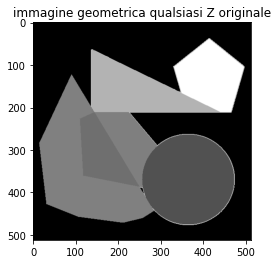

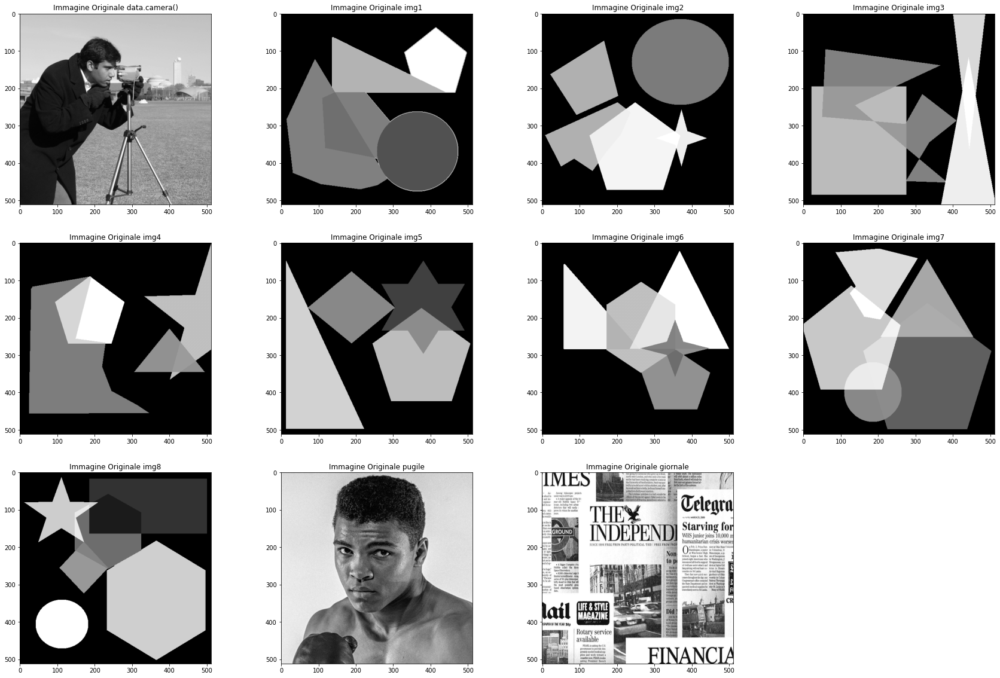

In [2]:
#QUESTA PARTE VA BENE ANCHE PER FUTURI TEST

from skimage.io import imread
from skimage import data
X = data.camera().astype(np.float64) / 255.0

m, n = X.shape
x = X.reshape(m*n)

#dichiarazione variabili immagini geometriche
AA = imread("./img/img1.png", as_gray=True).astype(np.float64)
aa = AA.reshape(m*n)
BB = imread("./img/img2.png", as_gray=True).astype(np.float64)
bb = BB.reshape(m*n)
CC = imread("./img/img3.png", as_gray=True).astype(np.float64)
cc = CC.reshape(m*n)
DD = imread("./img/img4.png", as_gray=True).astype(np.float64)
dd = DD.reshape(m*n)
EE = imread("./img/img5.png", as_gray=True).astype(np.float64)
ee = EE.reshape(m*n)
FF = imread("./img/img6.png", as_gray=True).astype(np.float64)
ff = FF.reshape(m*n)
GG = imread("./img/img7.png", as_gray=True).astype(np.float64)
gg = GG.reshape(m*n)
HH = imread("./img/img8.png", as_gray=True).astype(np.float64)
hh = HH.reshape(m*n)
II = imread("./img/pugile.png", as_gray=True).astype(np.float64)
ii = II.reshape(m*n)
LL = imread("./img/giornale.png", as_gray=True).astype(np.float64)
ll = LL.reshape(m*n)

#una qualsiasi immagine geometrica (considero img1)
Z = AA
z = aa
plt.imshow(Z, cmap="gray", vmin=0, vmax=1)
plt.title('immagine geometrica qualsiasi Z originale')

#dichiarazione lista immagini geometriche
alfabeto = [AA, BB, CC, DD, EE, FF, GG, HH]     # X per data.camera()

#stampa di tutte le immagini originali
plt.figure(figsize=(30, 20))
i=0
while i<=len(alfabeto):
    if i==0:
        plt.subplot(3, 4, 1).imshow(X, cmap="gray")
        plt.title('Immagine Originale data.camera()')
        i+=1
    else:
        plt.subplot(3, 4, i+1).imshow(alfabeto[i-1], cmap='gray')
        plt.title(f'Immagine Originale img{i}')
        i+=1

plt.subplot(3, 4, i+1).imshow(II, cmap='gray')
plt.title('Immagine Originale pugile')
plt.subplot(3, 4, i+2).imshow(LL, cmap='gray')
plt.title('Immagine Originale giornale')

## 1) Generazione immagini corrotte
Degradare le immagini applicando, mediante le funzioni riportate nella cella precedente,  l'operatore di blur con parametri

+ $\sigma=0.5$ dimensione $5\times 5$
+ $\sigma=1$ dimensione $7\times 7$
+ $\sigma=1.3$ dimensione $9\times 9$

ed aggiungendo rumore gaussiano con deviazione standard $(0,0.05]$

In [3]:
#Riportare delle tabelle con le misure di PSNR e MSE ottenute al variare dei parametri 
#(dimensione kernel, valore di sigma, la deviazione standard del rumore, il parametro di regolarizzazione).
from tabulate import tabulate
head = ["Nome Im", "DimKer", "Sigma", "Noise Dev", "PSNR", "MSE"]
tabellaValori = np.array([[5, 0.5, 0.02],
                          [5, 0.5, 0.04],
                          [5, 0.5, 0.08],
                          [5, 0.5, 0.16],
                          [5, 0.5, 0.32],
                          [7, 1, 0.02],
                          [7, 1, 0.04],
                          [7, 1, 0.08],
                          [7, 1, 0.16],
                          [7, 1, 0.32],
                          [9, 1.3, 0.02],
                          [9, 1.3, 0.04],
                          [9, 1.3, 0.08],
                          [9, 1.3, 0.16],
                          [9, 1.3, 0.32]])
#print(tabulate(tabellaFinale, headers=head, tablefmt="grid"))
for tupla in tabellaValori:
  tabellaFinale = [] #resettata ad ogni inizio di iterazione
  contatoreAscii = 65
  K = psf_fft(gaussian_kernel(int(tupla[0]), tupla[1]), int(tupla[0]), X.shape)
  std_dev = tupla[2]
  noise = np.random.normal(size=X.shape)*std_dev

  X_blur = A(X, K)
  x_blur = X_blur.reshape(m*n)

  B = X_blur + noise
  b = B.reshape(m*n)

  #Maggiore è il valore del PSNR maggiore è la "somiglianza" con l'immagine originale,
  #nel senso che si “avvicina” maggiormente ad essa da un punto di vista percettivo umano.
  # => PSNR(X,X)=inf
  PSNR = metrics.peak_signal_noise_ratio(X, B)

  #blur delle immagini img1-8.png e relativi PSNR
  AA_blur = A(AA, K) + noise
  aa_blur = AA_blur.reshape(m*n)
  PSNR_AA = metrics.peak_signal_noise_ratio(AA,AA_blur)
  MSE_AA = metrics.mean_squared_error(AA, AA_blur)

  BB_blur = A(BB, K) + noise
  bb_blur = BB_blur.reshape(m*n)
  PSNR_BB = metrics.peak_signal_noise_ratio(BB,BB_blur)
  MSE_BB = metrics.mean_squared_error(BB,BB_blur)

  CC_blur = A(CC,K) + noise
  cc_blur = CC_blur.reshape(m*n)
  PSNR_CC = metrics.peak_signal_noise_ratio(CC,CC_blur)
  MSE_CC = metrics.mean_squared_error(CC,CC_blur)

  DD_blur = A(DD,K) + noise
  dd_blur = DD_blur.reshape(m*n)
  PSNR_DD = metrics.peak_signal_noise_ratio(DD,DD_blur)
  MSE_DD = metrics.mean_squared_error(DD,DD_blur)

  EE_blur = A(EE,K) + noise
  ee_blur = EE_blur.reshape(m*n)
  PSNR_EE = metrics.peak_signal_noise_ratio(EE,EE_blur)
  MSE_EE = metrics.mean_squared_error(EE,EE_blur)

  FF_blur = A(FF,K) + noise
  ff_blur = FF_blur.reshape(m*n)
  PSNR_FF = metrics.peak_signal_noise_ratio(FF,FF_blur)
  MSE_FF = metrics.mean_squared_error(FF,FF_blur)

  GG_blur = A(GG,K) + noise
  gg_blur = GG_blur.reshape(m*n)
  PSNR_GG = metrics.peak_signal_noise_ratio(GG,GG_blur)
  MSE_GG = metrics.mean_squared_error(GG,GG_blur)

  HH_blur = A(HH,K) + noise
  hh_blur = HH_blur.reshape(m*n)
  PSNR_HH = metrics.peak_signal_noise_ratio(HH,HH_blur)
  MSE_HH = metrics.mean_squared_error(HH,HH_blur)

  II_blur = A(II, K) + noise
  ii_blur = II_blur.reshape(m*n)
  PSNR_II = metrics.peak_signal_noise_ratio(II,II_blur)
  MSE_II = metrics.mean_squared_error(II,II_blur)

  LL_blur = A(LL, K) + noise
  ll_blur = LL_blur.reshape(m*n)
  PSNR_LL = metrics.peak_signal_noise_ratio(LL,LL_blur)
  MSE_LL = metrics.mean_squared_error(LL,LL_blur)

  #dichiarazione liste immagini geometriche (escludo data.camera() e immagini fotografiche)
  alfabetoblur = [AA_blur, BB_blur, CC_blur, DD_blur, EE_blur, FF_blur, GG_blur, HH_blur]     # B per data.camera()
  xx = [aa_blur, bb_blur, cc_blur, dd_blur, ee_blur, ff_blur, gg_blur, hh_blur]       # b per data.camera()
  psnralfabeto = [PSNR_AA, PSNR_BB, PSNR_CC, PSNR_DD, PSNR_EE, PSNR_FF, PSNR_GG, PSNR_HH, PSNR_II, PSNR_LL]
  msealfabeto = [MSE_AA, MSE_BB, MSE_CC, MSE_DD, MSE_EE, MSE_FF, MSE_GG, MSE_HH, MSE_II, MSE_LL]

  for i in range(10):
    tabellaFinale.append([str(chr(contatoreAscii + i)) + str(chr(contatoreAscii + i)) + "_blur", tupla[0], tupla[1], tupla[2], psnralfabeto[i], msealfabeto[i]])
  print(tabulate(tabellaFinale, headers=head, tablefmt="grid"))
  #calcolo media PSNR e media MSE
  mediapsnr = sum(psnralfabeto) / len(psnralfabeto)
  print('Media PNSR: ', mediapsnr)
  mediamse = sum(msealfabeto) / len(msealfabeto)
  print('Media MSE: ', mediamse)

  #converto in array PSNR e MSE e ricavo std di ognuno
  psnr_array = np.array(psnralfabeto)
  mse_array = np.array(msealfabeto)

  mse_std = np.std(mse_array)
  print('msestd ', mse_std)
  psnr_std = np.std(psnr_array)
  print('psnrstd ', psnr_std)

  #stampa delle immagini originali e corrotte con subplot
  plt.figure(figsize=(60, 10))
  i=0
  plot=1
  while plot<=2*len(alfabeto)+2:      # +2 perche' devo includere il caso data.camera()
      if plot==1:
          plt.subplot(2, 9, plot).imshow(X, cmap='gray', vmin=0, vmax=1)
          plt.title('Immagine Originale data.camera()')
          i+=1
          plot+=1
      elif plot==10:
          plt.subplot(2, 9, plot).imshow(B, cmap='gray', vmin=0, vmax=1)
          plt.title(f'Immagine Corrotta data.camera() (PSNR: {PSNR:.2f})')
          i=1
          plot+=1
      elif plot<10:
          plt.subplot(2,9,plot).imshow(alfabeto[i-1], cmap='gray')
          plt.title(f'Immagine Originale img{i}')
          i+=1
          plot+=1
      else:
          plt.subplot(2,9,plot).imshow(alfabetoblur[i-1], cmap='gray')
          plt.title(f'Immagine Corrotta img{i} (PSNR: {psnralfabeto[i-1]:.2f}) (MSE: {msealfabeto[i-1]:.5f})')
          plot+=1
          i+=1
  plt.show()

print("\n\n\nISTANZA DEL PROBLEMA\n")
K = psf_fft(gaussian_kernel(9, 1.3), 9, X.shape)
std_dev = 0.02
noise = np.random.normal(size=X.shape)*std_dev

X_blur = A(X, K)
x_blur = X_blur.reshape(m*n)

B = X_blur + noise
b = B.reshape(m*n)

#Maggiore è il valore del PSNR maggiore è la "somiglianza" con l'immagine originale,
#nel senso che si “avvicina” maggiormente ad essa da un punto di vista percettivo umano.
# => PSNR(X,X)=inf
PSNR = metrics.peak_signal_noise_ratio(X, B)

#blur delle immagini img1-8.png e relativi PSNR
AA_blur = A(AA, K) + noise
aa_blur = AA_blur.reshape(m*n)
PSNR_AA = metrics.peak_signal_noise_ratio(AA,AA_blur)
MSE_AA = metrics.mean_squared_error(AA, AA_blur)

BB_blur = A(BB, K) + noise
bb_blur = BB_blur.reshape(m*n)
PSNR_BB = metrics.peak_signal_noise_ratio(BB,BB_blur)
MSE_BB = metrics.mean_squared_error(BB,BB_blur)

CC_blur = A(CC,K) + noise
cc_blur = CC_blur.reshape(m*n)
PSNR_CC = metrics.peak_signal_noise_ratio(CC,CC_blur)
MSE_CC = metrics.mean_squared_error(CC,CC_blur)

DD_blur = A(DD,K) + noise
dd_blur = DD_blur.reshape(m*n)
PSNR_DD = metrics.peak_signal_noise_ratio(DD,DD_blur)
MSE_DD = metrics.mean_squared_error(DD,DD_blur)

EE_blur = A(EE,K) + noise
ee_blur = EE_blur.reshape(m*n)
PSNR_EE = metrics.peak_signal_noise_ratio(EE,EE_blur)
MSE_EE = metrics.mean_squared_error(EE,EE_blur)

FF_blur = A(FF,K) + noise
ff_blur = FF_blur.reshape(m*n)
PSNR_FF = metrics.peak_signal_noise_ratio(FF,FF_blur)
MSE_FF = metrics.mean_squared_error(FF,FF_blur)

GG_blur = A(GG,K) + noise
gg_blur = GG_blur.reshape(m*n)
PSNR_GG = metrics.peak_signal_noise_ratio(GG,GG_blur)
MSE_GG = metrics.mean_squared_error(GG,GG_blur)

HH_blur = A(HH,K) + noise
hh_blur = HH_blur.reshape(m*n)
PSNR_HH = metrics.peak_signal_noise_ratio(HH,HH_blur)
MSE_HH = metrics.mean_squared_error(HH,HH_blur)

II_blur = A(II, K) + noise
ii_blur = II_blur.reshape(m*n)
PSNR_II = metrics.peak_signal_noise_ratio(II,II_blur)
MSE_II = metrics.mean_squared_error(II,II_blur)

LL_blur = A(LL, K) + noise
ll_blur = LL_blur.reshape(m*n)
PSNR_LL = metrics.peak_signal_noise_ratio(LL,LL_blur)
MSE_LL = metrics.mean_squared_error(LL,LL_blur)

#dichiarazione liste immagini geometriche (escludo data.camera() e immagini fotografiche)
alfabetoblur = [AA_blur, BB_blur, CC_blur, DD_blur, EE_blur, FF_blur, GG_blur, HH_blur]     # B per data.camera()
xx = [aa_blur, bb_blur, cc_blur, dd_blur, ee_blur, ff_blur, gg_blur, hh_blur]       # b per data.camera()
psnralfabeto = [PSNR_AA, PSNR_BB, PSNR_CC, PSNR_DD, PSNR_EE, PSNR_FF, PSNR_GG, PSNR_HH]
msealfabeto = [MSE_AA, MSE_BB, MSE_CC, MSE_DD, MSE_EE, MSE_FF, MSE_GG, MSE_HH]

#calcolo media PSNR e media MSE
mediapsnr = sum(psnralfabeto) / len(psnralfabeto)
print('Media PNSR: ', mediapsnr)
mediamse = sum(msealfabeto) / len(msealfabeto)
print('Media MSE: ', mediamse)

#converto in array PSNR e MSE e ricavo std di ognuno
psnr_array = np.array(psnralfabeto)
mse_array = np.array(msealfabeto)

mse_std = np.std(mse_array)
print('msestd ', mse_std)
psnr_std = np.std(psnr_array)
print('psnrstd ', psnr_std)

#stampa delle immagini originali e corrotte con subplot
plt.figure(figsize=(60, 10))
i=0
plot=1
while plot<=2*len(alfabeto)+2:      # +2 perche' devo includere il caso data.camera()
    if plot==1:
        plt.subplot(2, 9, plot).imshow(X, cmap='gray', vmin=0, vmax=1)
        plt.title('Immagine Originale data.camera()')
        i+=1
        plot+=1
    elif plot==10:
        plt.subplot(2, 9, plot).imshow(B, cmap='gray', vmin=0, vmax=1)
        plt.title(f'Immagine Corrotta data.camera() (PSNR: {PSNR:.2f})')
        i=1
        plot+=1
    elif plot<10:
        plt.subplot(2,9,plot).imshow(alfabeto[i-1], cmap='gray')
        plt.title(f'Immagine Originale img{i}')
        i+=1
        plot+=1
    else:
        plt.subplot(2,9,plot).imshow(alfabetoblur[i-1], cmap='gray')
        plt.title(f'Immagine Corrotta img{i} (PSNR: {psnralfabeto[i-1]:.2f}) (MSE: {msealfabeto[i-1]:.5f})')
        plot+=1
        i+=1
plt.show()


+-----------+----------+---------+-------------+---------+-------------+
| Nome Im   |   DimKer |   Sigma |   Noise Dev |    PSNR |         MSE |
+===========+==========+=========+=============+=========+=============+
| AA_blur   |        5 |     0.5 |        0.02 | 29.9467 | 0.00101236  |
+-----------+----------+---------+-------------+---------+-------------+
| BB_blur   |        5 |     0.5 |        0.02 | 31.0296 | 0.000788942 |
+-----------+----------+---------+-------------+---------+-------------+
| CC_blur   |        5 |     0.5 |        0.02 | 30.2763 | 0.00093837  |
+-----------+----------+---------+-------------+---------+-------------+
| DD_blur   |        5 |     0.5 |        0.02 | 31.3813 | 0.000727563 |
+-----------+----------+---------+-------------+---------+-------------+
| EE_blur   |        5 |     0.5 |        0.02 | 31.2371 | 0.000752132 |
+-----------+----------+---------+-------------+---------+-------------+
| FF_blur   |        5 |     0.5 |        0.02 | 30

KeyboardInterrupt: 

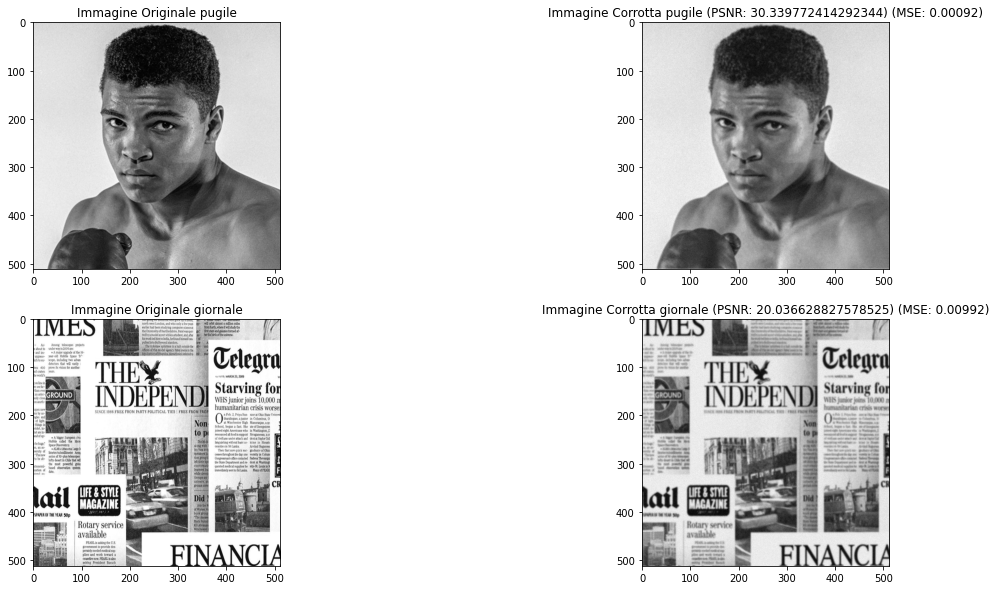

In [ ]:
 # stampa immagini fotografiche
plt.figure(figsize=(20, 10))
plt.subplot(221).imshow(II, cmap='gray')
plt.title('Immagine Originale pugile')
plt.subplot(222).imshow(II_blur, cmap='gray')
plt.title(f'Immagine Corrotta pugile (PSNR: {PSNR_II}) (MSE: {MSE_II:.5f})')

plt.subplot(223).imshow(LL, cmap='gray')
plt.title('Immagine Originale giornale')
plt.subplot(224).imshow(LL_blur, cmap='gray')
plt.title(f'Immagine Corrotta giornale (PSNR: {PSNR_LL}) (MSE: {MSE_LL:.5f})')
plt.show()

## 2) Soluzione naive

Una possibile ricostruzione dell'immagine originale $x$ partendo dall'immagine corrotta $b$ è la soluzione naive data dal minimo del seguente problema di ottimizzazione:
\begin{align}
  x^* = \arg\min_x \frac{1}{2} ||Ax - b||_2^2
\end{align}

La funzione $f$ da minimizzare è data dalla formula
  $f(x) = \frac{1}{2} ||Ax - b||_2^2 $, il cui gradiente $\nabla f$ è dato da
$\nabla f(x) = A^TAx - A^Tb  $.

Utilizzando il metodo del gradiente coniugato implementato dalla funzione `minimize` calcolare la soluzione naive. 

         Current function value: 100.564109
         Iterations: 1
         Function evaluations: 6
         Gradient evaluations: 6
         Current function value: 54.655448
         Iterations: 2
         Function evaluations: 8
         Gradient evaluations: 8
         Current function value: 46.380965
         Iterations: 3
         Function evaluations: 10
         Gradient evaluations: 10
         Current function value: 42.853440
         Iterations: 4
         Function evaluations: 12
         Gradient evaluations: 12
         Current function value: 40.645273
         Iterations: 5
         Function evaluations: 14
         Gradient evaluations: 14
         Current function value: 39.038830
         Iterations: 6
         Function evaluations: 16
         Gradient evaluations: 16
         Current function value: 37.754177
         Iterations: 7
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 36.689430
         Iterations: 8

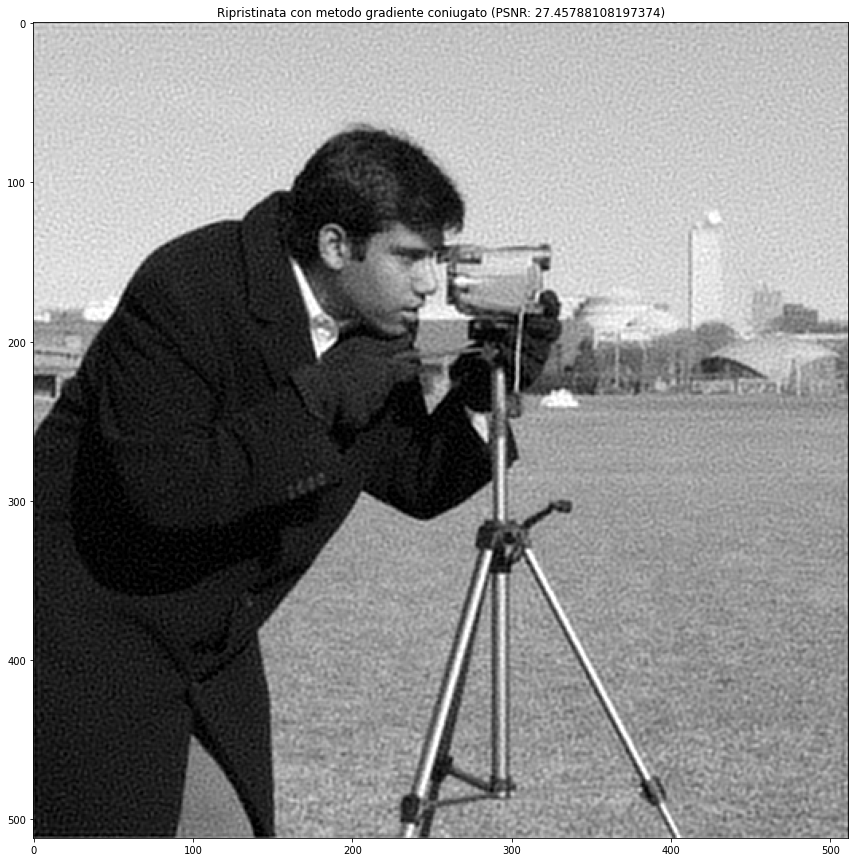

In [ ]:
from scipy.optimize import minimize
def f(x, B, labda = 0):
  X = x.reshape(m,n)
  res = 0.5*(np.linalg.norm(A(X, K)-B))**2 + 0.5*labda*(np.linalg.norm(X))**2
  return np.sum(res)
def df(x, B, labda=0):
  X = x.reshape(m,n)
  res = AT(A(X, K)-B, K) + labda*X
  RES = np.reshape(res, m*n)
  return RES


#l'applico all'immagine del cameraman
listaIterazioni = np.arange(51) #0 1 2 3 4 5 6...50 . METTERE 31-51 PER RELAZIONE MESSO 11 PER FARE PRIMA
listaIterazioni = listaIterazioni[1:] #altrimenti avrebbe incluso anche lo 0

listaValGradCG = []
listaErrRelCG = []
listaPSNRCG = []
listaValFunCG = [] #un metodo può raggiungere un punto stazionario e non il minimo! => cercare chi ha il valore della funzione più piccolo


for i in listaIterazioni:
  func = lambda x: f(x, B) 
  grad_func = lambda x: df(x, B)
  res = minimize(func, np.zeros(b.shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':i})
  RES = res.x.reshape(m,n)
  PSNR = metrics.peak_signal_noise_ratio(X, RES)
  listaValGradCG.append(np.linalg.norm(res.jac.reshape(m,n), "fro"))
  listaErrRelCG.append(np.linalg.norm(RES - X, "fro")/np.linalg.norm(X, "fro"))
  listaPSNRCG.append(PSNR)
  listaValFunCG.append(res.fun) #res.fun = float => scalare


#stampa immagine data.camera()
func = lambda x: f(x, B) #o exec 
grad_func = lambda x: df(x, B)
res = minimize(func, np.zeros(b.shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':6})
RES = res.x.reshape(m,n)
PSNR = metrics.peak_signal_noise_ratio(X, RES) #alfabeto[4] solo lettere

plt.figure(figsize=(20,15))
plt.title(f'Ripristinata con metodo gradiente coniugato (PSNR: {PSNR})')
plt.imshow(RES, cmap="gray", vmin=0, vmax=1)

         Current function value: 40.391167
         Iterations: 5
         Function evaluations: 14
         Gradient evaluations: 14
         Current function value: 40.369439
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
         Current function value: 40.884747
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
         Current function value: 40.287799
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
         Current function value: 40.303695
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
         Current function value: 40.384134
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
         Current function value: 40.446050
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
         Current function value: 40.909144
         Iterations

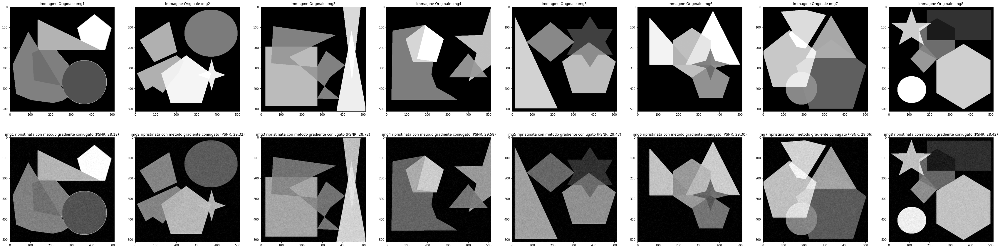

In [ ]:
''' per ricordare definizioni
alfabetoblur = [AA_blur, BB_blur, CC_blur, DD_blur, EE_blur, FF_blur, GG_blur, HH_blur]     # B per data.camera()
xx = [aa_blur, bb_blur, cc_blur, dd_blur, ee_blur, ff_blur, gg_blur, hh_blur]       # b per data.camera()
'''


#! stampa delle immagini geometriche
plt.figure(figsize=(60, 15))
i=0
plot=1
while plot<=2*len(alfabeto):
  
    if plot<=8:
        plt.subplot(2,8,plot).imshow(alfabeto[i], cmap='gray')
        plt.title(f'Immagine Originale img{i+1}')
        i+=1
        plot+=1
    else:
        if plot==9:
            i=0
        func = lambda x: f(x, alfabetoblur[i]) #o exec
        grad_func = lambda x: df(x, alfabetoblur[i])
        xxzeros = xx[i]
        res = minimize(func, np.zeros(xxzeros.shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':5})
        RES = res.x.reshape(m,n)
        PSNR = metrics.peak_signal_noise_ratio(alfabeto[i], RES)
        plt.subplot(2, 8, plot).imshow(RES, cmap="gray", vmin=0, vmax=1)
        plt.title(f'img{i+1} ripristinata con metodo gradiente coniugato (PSNR: {PSNR:.2f})')

        plot+=1
        i+=1
plt.show()

         Current function value: 38.775004
         Iterations: 6
         Function evaluations: 15
         Gradient evaluations: 15
         Current function value: 45.408680
         Iterations: 6
         Function evaluations: 15
         Gradient evaluations: 15


Text(0.5, 1.0, 'immagine pugile ripristinata con metodo gradiente coniugato (PSNR: 20.036628827578525)')

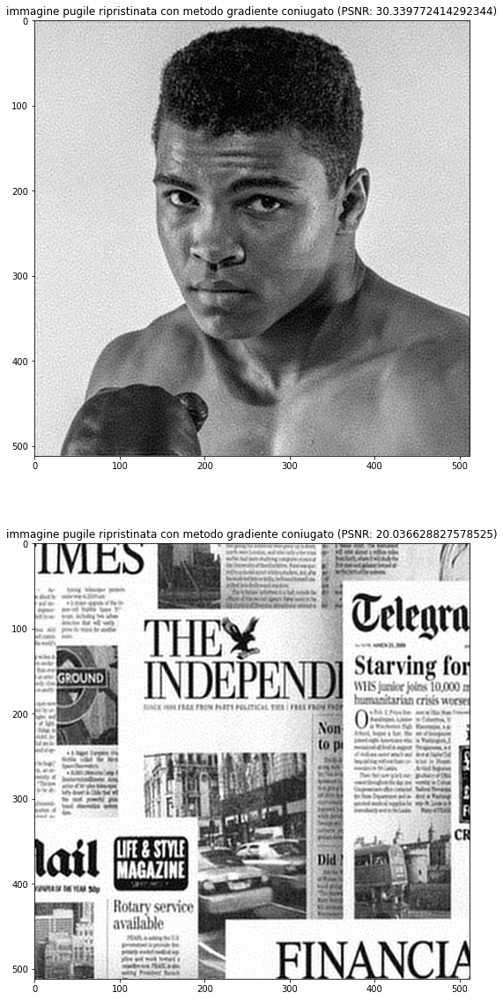

In [ ]:
# stampa immagini fotografiche ripristinate
plt.figure(figsize=(10, 20))
 #stampa pugile
func = lambda x: f(x, II_blur) #o exec 
grad_func = lambda x: df(x, II_blur)
res = minimize(func, np.zeros(ii_blur.shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':6})
RES = res.x.reshape(m,n)

PSNR = metrics.peak_signal_noise_ratio(II, RES)
plt.subplot(211).imshow(RES, cmap="gray", vmin=0, vmax=1)
plt.title(f'immagine pugile ripristinata con metodo gradiente coniugato (PSNR: {PSNR_II})')

#stampa giornale
func = lambda x: f(x, LL_blur) #o exec 
grad_func = lambda x: df(x, LL_blur)
res = minimize(func, np.zeros(ll_blur.shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':6})
RES = res.x.reshape(m,n)

PSNR = metrics.peak_signal_noise_ratio(LL, RES)
plt.subplot(212).imshow(RES, cmap="gray", vmin=0, vmax=1)
plt.title(f'immagine pugile ripristinata con metodo gradiente coniugato (PSNR: {PSNR_LL})')


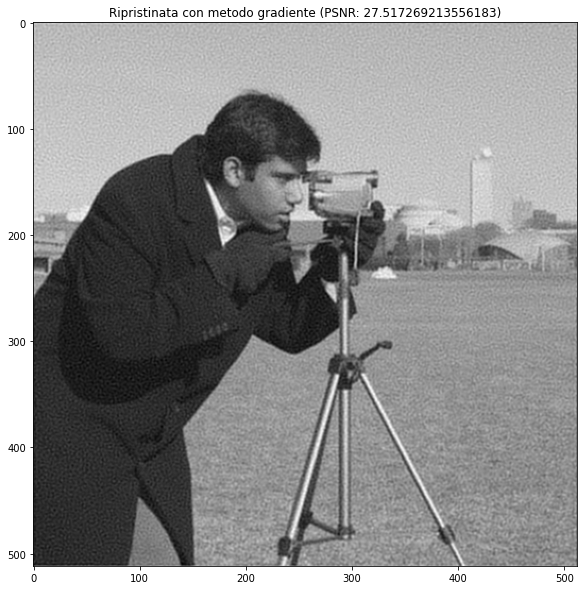

In [ ]:
listaValGradG = []
listaErrRelG = []
listaPSNRG = []
listaValFunG = []

def next_step(x, grad, B, labda = 0): # backtracking procedure for the choice of the steplength
  alpha=1.1
  c1 = 0.25
  p=-grad
  j=0
  jmax=10
  #condizioni che servono per soddisfare dei criteri di convergenza - condizioni di Wolfe
  while ((f(x + alpha*p, B, labda) > f(x, B, labda)+c1*alpha*grad.T@p) and j<jmax):
    alpha = alpha*0.5
    j+=1
  return alpha

def gradient_minimize(B, labda= 0, maxit=19, abstop = 1.e-6):
  x_last =np.zeros(m*n)
  k = 0
  while (np.linalg.norm(df(x_last, B, labda))>abstop and k < maxit):
    k=k+1
    grad = df(x_last, B, labda)
    step = next_step(x_last, grad, B, labda)

    listaValFunG.append(f(x_last, B))
    x_last=x_last-step*grad

    listaValGradG.append(np.linalg.norm(grad.reshape(m,n), "fro"))
    listaErrRelG.append(np.linalg.norm(x_last.reshape(m,n) - X, "fro")/np.linalg.norm(X, "fro"))
    listaPSNRG.append(metrics.peak_signal_noise_ratio(X, x_last.reshape(m,n)))
  return x_last

z_naive = gradient_minimize(B, labda = 0, maxit = 27)#Messo maxit = 50 per studiare metodi e loro velocità
PSNR = metrics.peak_signal_noise_ratio(X, z_naive.reshape(m,n))#cambiare anche qui ogni volta nome immagine originale
plt.figure(figsize=(30,10))
plt.title(f'Ripristinata con metodo gradiente (PSNR: {PSNR})')
plt.imshow(z_naive.reshape(m,n), cmap="gray")


vero minimo = 52.65820400528509


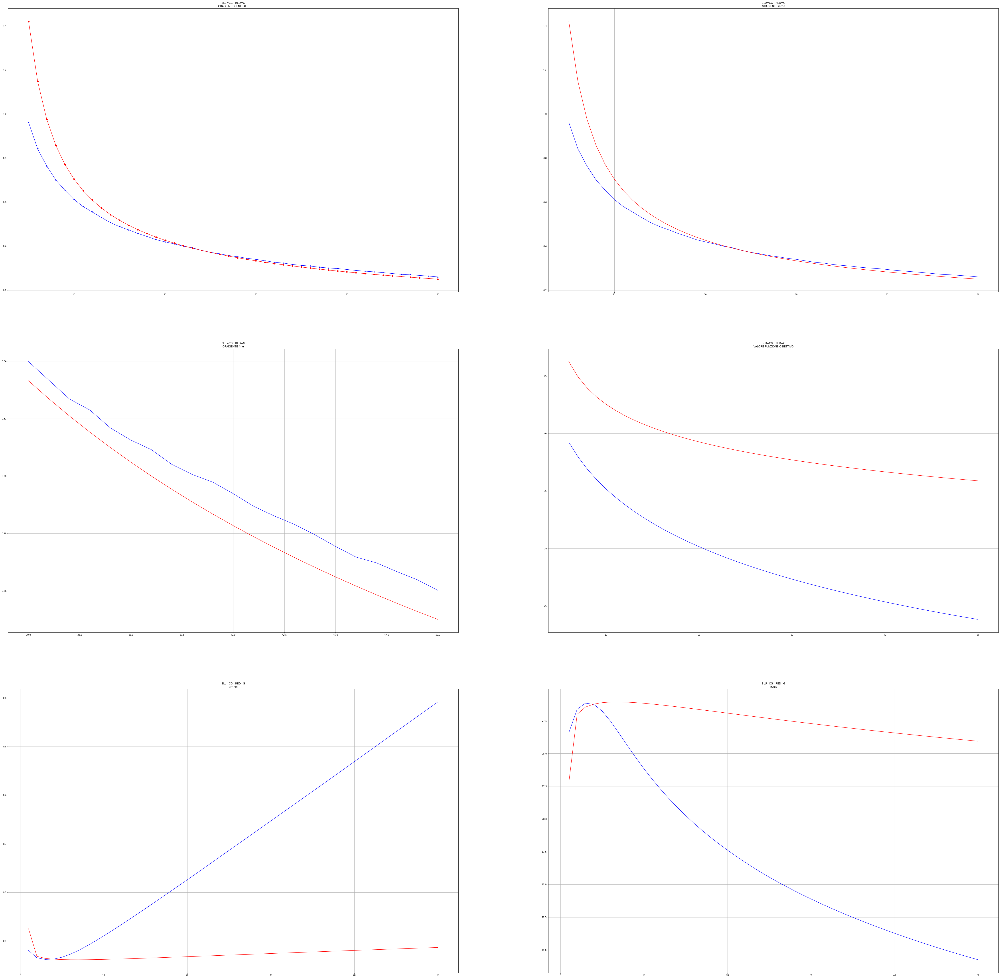

In [ ]:
#!!!!!!!!!!!!!!!NON RUNNARE QUESTA CELLA, ti darà errore poichè non stiamo più analizzando metodi######

print(f"valore in f di x true = {f(x, B)}")

########STUDIATO IL COMPORTAMENTO DEI METODI SULL'IMMAGINE CAMERAMAN##########
plt.figure(figsize=(80,80))

plt.subplot(321)
plt.title("BLU=CG   RED=G\nGRADIENTE GENERALE")
plt.grid()
plt.plot(listaIterazioni[4:], listaValGradCG[4:], color="blue", marker="*")
plt.plot(listaIterazioni[4:len(listaValGradG)], listaValGradG[4:], color="red", marker="o")

plt.subplot(322)
plt.title("BLU=CG   RED=G\nGRADIENTE inizio")
plt.grid()
plt.plot(listaIterazioni[4:], listaValGradCG[4:], color="blue")
plt.plot(listaIterazioni[4:len(listaValGradG)], listaValGradG[4:], color="red")

plt.subplot(323)
plt.title("BLU=CG   RED=G\nGRADIENTE fine")
plt.grid()
plt.plot(listaIterazioni[29:], listaValGradCG[29:], color="blue")
plt.plot(listaIterazioni[29:], listaValGradG[29:], color="red")

plt.subplot(324)
plt.title("BLU=CG   RED=G\nVALORE FUNZIONE OBIETTIVO")
plt.grid()
plt.plot(listaIterazioni[5:], listaValFunCG[5:], color="blue")
plt.plot(listaIterazioni[5:], listaValFunG[5:], color="red")


plt.subplot(325)
plt.title("BLU=CG   RED=G\nErr Rel")
plt.grid()
plt.plot(listaIterazioni, listaErrRelCG, color="blue")
plt.plot(listaIterazioni, listaErrRelG, color="red")

plt.subplot(326)
plt.title("BLU=CG   RED=G\nPSNR")
plt.grid()
plt.plot(listaIterazioni, listaPSNRCG, color="blue")
plt.plot(listaIterazioni, listaPSNRG, color="red")
plt.show()


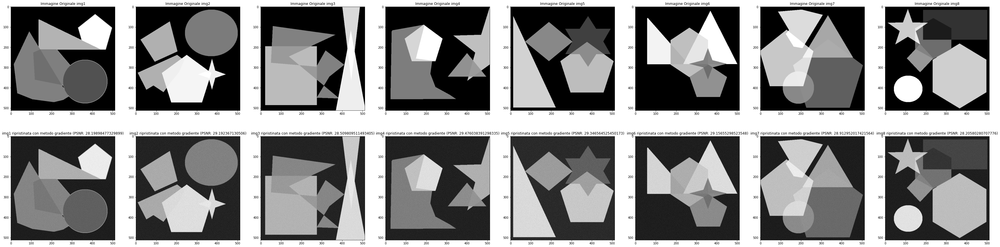

In [ ]:
#! stampa delle immagini geometrich
plt.figure(figsize=(60, 15))
i=0
plot=1
while plot<=2*len(alfabeto):
  
    if plot<=8:
        plt.subplot(2,8, plot).imshow(alfabeto[i], cmap='gray')
        plt.title(f'Immagine Originale img{i+1}')
        i+=1
        plot+=1
    else:
        if plot==9:
            i=0
        a_naive = gradient_minimize(alfabetoblur[i])
        PSNR = metrics.peak_signal_noise_ratio(alfabeto[i], a_naive.reshape(m,n))#cambiare anche qui ogni volta nome immagine originale
        
        i+=1
        plt.subplot(2, 8, plot).imshow(a_naive.reshape(m,n), cmap="gray")
        plt.title(f'img{i} ripristinata con metodo gradiente (PSNR: {PSNR})')
        plot+=1
plt.show()

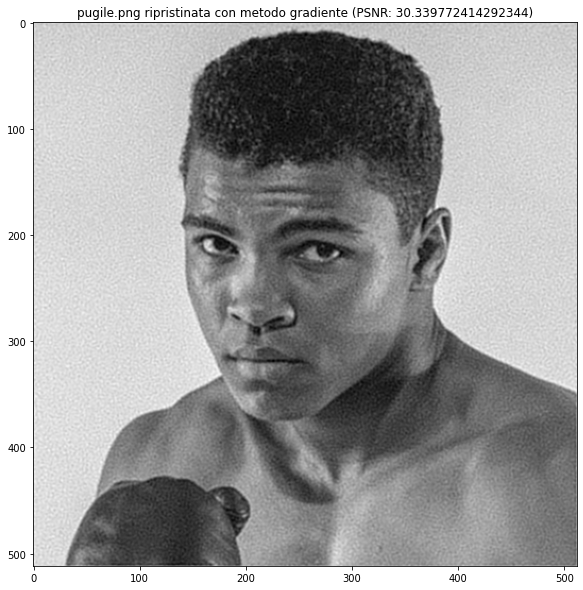

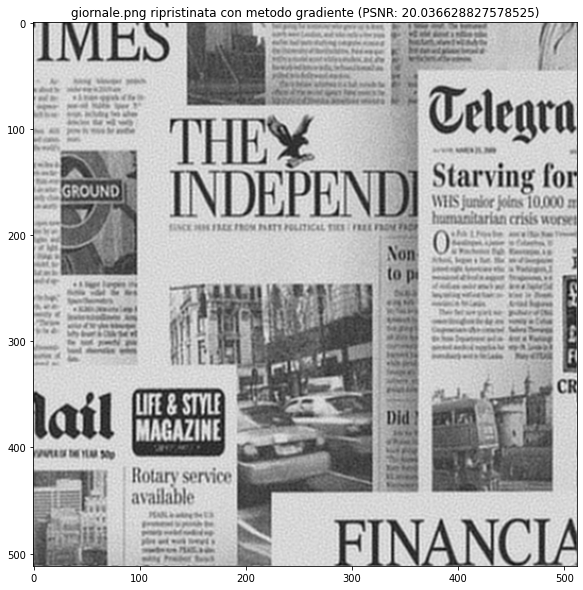

In [ ]:
# stampa immagini fotografiche
# immagine pugile
z_naive = gradient_minimize(II_blur)
PSNR = metrics.peak_signal_noise_ratio(II, z_naive.reshape(m,n))#cambiare anche qui ogni volta nome immagine originale
plt.figure(figsize=(30,10))
plt.title(f'pugile.png ripristinata con metodo gradiente (PSNR: {PSNR_II})')
plt.imshow(z_naive.reshape(m,n), cmap="gray")

z_naive = gradient_minimize(LL_blur)
PSNR = metrics.peak_signal_noise_ratio(LL, z_naive.reshape(m,n))#cambiare anche qui ogni volta nome immagine originale
plt.figure(figsize=(30,10))
plt.title(f'giornale.png ripristinata con metodo gradiente (PSNR: {PSNR_LL})')
plt.imshow(z_naive.reshape(m,n), cmap="gray")

## 3) Regolarizzazione
Per ridurre gli effetti del rumore nella ricostruzione è necessario introdurre un termine di regolarizzazione di Tikhonov. Si considera quindi il seguente problema di ottimizzazione.
\begin{align*}
  x^* = \arg\min_x \frac{1}{2} ||Ax - b||_2^2 + \frac{\lambda}{2} ||x||_2^2
\end{align*}

La funzione $f$ da minimizzare diventa
$f(x) = \frac{1}{2} ||Ax - b||_2^2 + \frac{\lambda}{2} ||x||_2^2$
il cui gradiente $\nabla f$ è dato da
$\nabla f(x) = A^TAx - A^Tb + λx$.

Utilizzando il metodo del gradiente coniugato implementato dalla funzione `minimize` ed il metodo del gradiente implementato a lezione, calcolare la soluzione del precendente problema di minimo regolarizzato per differenti valori di $\lambda$. 

In [ ]:
####QUA HO VISTO CHE C'ERA UNA COSA DA AGGIUNGERE ==> era la media PSNR sembra fatto##########

labda = list(np.linspace(1e-7, 1e-1, 100))
# lista per grafico 
lista_lambda = []
lista_psnr = []
lista_mse = []

#! aggiungere media
media_psnr=0

massimoPSNR = [-9999, 0] #PSNR e LAMBDA
fotoMaxPSNR = np.zeros((m,n))

minimoPSNR = [9999, 0] #PSNR e LAMBDA
fotoMinPSNR = np.zeros((m,n))

#calcola grafico PSNR
#si analizza come la regolarizzazione possa migliorare psnr dell'immagine blurrata 
for i in range(100): 
  func = lambda x: f(x, B, labda[i])
  grad_func = lambda x: df(x, B, labda[i])
  res = minimize(func, np.zeros(b.shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':6})
  RES = res.x.reshape(m,n)

  PSNR = metrics.peak_signal_noise_ratio(X, RES)
  MSE = metrics.mean_squared_error(X, RES)

  massimoPSNR[0] = max(massimoPSNR[0], PSNR)
  if massimoPSNR[0] == PSNR:
    fotoMaxPSNR = RES
    massimoPSNR[1] = labda[i]

  minimoPSNR[0] = min(minimoPSNR[0], PSNR)
  if minimoPSNR[0] == PSNR:
    fotoMinPSNR = RES
    minimoPSNR[1] = labda[i]

  lista_psnr.append(PSNR)
  lista_mse.append(MSE)
  lista_lambda.append(labda[i])
  media_psnr += PSNR
  print(f'lambda: {labda[i]} PSNR: {PSNR:.2f} MSE: {MSE:.5f}')
print(f'media psnr = {media_psnr/100}')

#https://www.geeksforgeeks.org/how-to-add-a-y-axis-label-to-the-secondary-y-axis-in-matplotlib/
# stampa grafico PSNR
fig, ax = plt.subplots(figsize = (10, 5))

ax2 = ax.twinx()
ax.plot(lista_lambda, lista_psnr, label='PSNR', color = "orange")
ax.plot(lista_lambda, [media_psnr/100 for i in range(100)], label='media PSNR', color = "orange")
ax2.plot(lista_lambda, lista_mse, label='MSE', color = "blue")

plt.title('Grafico data.camera(): ricostruzione con il metodo di regolarizzazione')
plt.legend(['PSNR', 'MSE'], loc='upper right')
plt.grid()

# giving labels to the axises
ax.set_xlabel('lambda')
ax.set_ylabel('PSNR e media')

# secondary y-axis label
ax2.set_ylabel("MSE")
 
# defining display layout
plt.tight_layout()
 
# show plot
plt.show()

'''
plt.plot(lista_lambda, lista_psnr, label='PSNR')
plt.plot(lista_lambda, lista_mse, label='MSE')
plt.plot(secondary_y=True, label="MSE", legend=True)
plt.title('Grafico data.camera(): ricostruzione con il metodo di regolarizzazione')
plt.legend(['PSNR', 'MSE'], loc='upper right')
plt.grid(True)
plt.show()
'''

plt.figure(figsize=(25, 75))
plt.subplot(131)
plt.title(f"Immagine corrotta\nPSNR = {metrics.peak_signal_noise_ratio(X, B)}")
plt.imshow(B, cmap="gray")
plt.subplot(132)
plt.title(f"Miglior immagine ottenuta con regolarizzazione\nPSNR = {massimoPSNR[0]} lambda = {massimoPSNR[1]}")
plt.imshow(fotoMaxPSNR, cmap="gray")
plt.subplot(133)
plt.title(f"Peggior immagine ottenuta con regolarizzazione\nPSNR = {minimoPSNR[0]} lambda = {minimoPSNR[1]}")
plt.imshow(fotoMinPSNR, cmap="gray")
plt.show()

         Current function value: 40.393616
         Iterations: 5
         Function evaluations: 14
         Gradient evaluations: 14
img1 -> lambda: 1e-07 PSNR: 28.179452892804065 MSE: 0.0015207390944269722
         Current function value: 65.104506
         Iterations: 5
         Function evaluations: 14
         Gradient evaluations: 14
img1 -> lambda: 0.0010102000000000002 PSNR: 28.211572571923345 MSE: 0.0015095334560446992
         Current function value: 89.762187
         Iterations: 5
         Function evaluations: 14
         Gradient evaluations: 14
img1 -> lambda: 0.0020203 PSNR: 28.241529266087596 MSE: 0.0014991568496500443
         Current function value: 114.366902
         Iterations: 5
         Function evaluations: 14
         Gradient evaluations: 14
img1 -> lambda: 0.0030304000000000004 PSNR: 28.269338375437087 MSE: 0.0014895879912401
         Current function value: 139.290427
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13

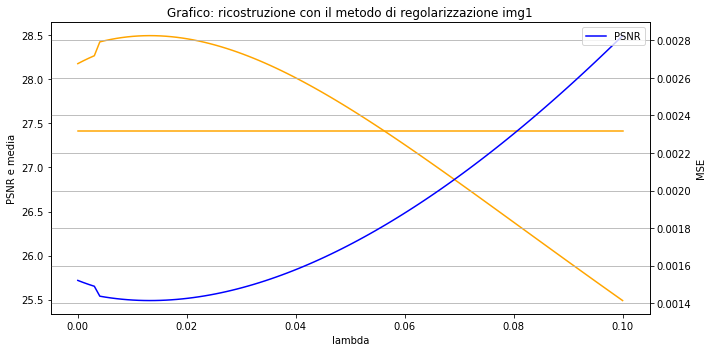

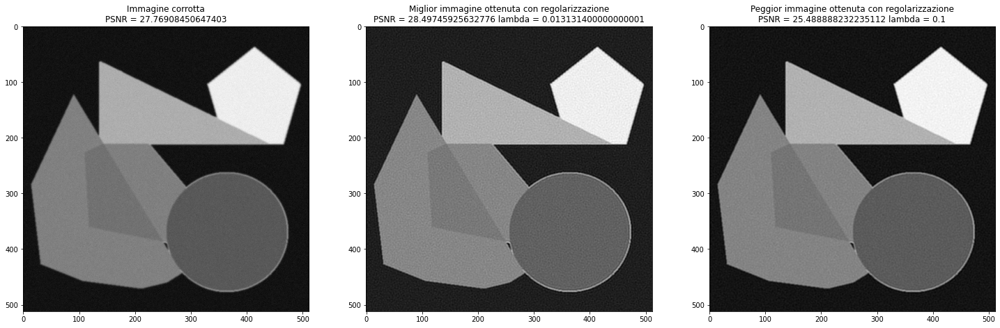

         Current function value: 40.371329
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img2 -> lambda: 1e-07 PSNR: 29.31896163297833 MSE: 0.0011697790433836974
         Current function value: 59.444109
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img2 -> lambda: 0.0010102000000000002 PSNR: 29.354659169104735 MSE: 0.0011602032644154258
         Current function value: 78.476025
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img2 -> lambda: 0.0020203 PSNR: 29.38836445329091 MSE: 0.001151233860316163
         Current function value: 97.467252
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img2 -> lambda: 0.0030304000000000004 PSNR: 29.420079369569926 MSE: 0.0011428574482860718
         Current function value: 116.417965
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13


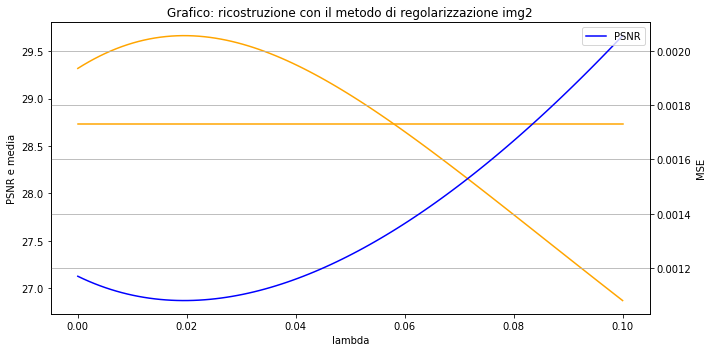

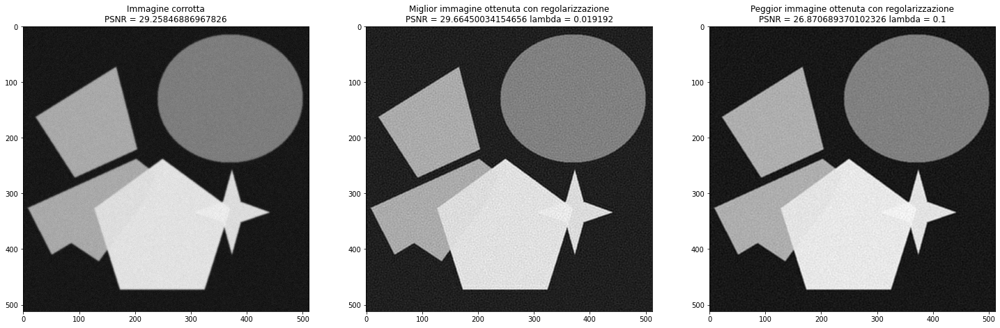

         Current function value: 40.887871
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img3 -> lambda: 1e-07 PSNR: 28.724033924634075 MSE: 0.0013415183190411482
         Current function value: 72.410658
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img3 -> lambda: 0.0010102000000000002 PSNR: 28.746364790785908 MSE: 0.0013346381073665126
         Current function value: 103.867091
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img3 -> lambda: 0.0020203 PSNR: 28.766392708048457 MSE: 0.001328497462418508
         Current function value: 135.257421
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img3 -> lambda: 0.0030304000000000004 PSNR: 28.784124264901834 MSE: 0.0013230844750881205
         Current function value: 166.581899
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations:

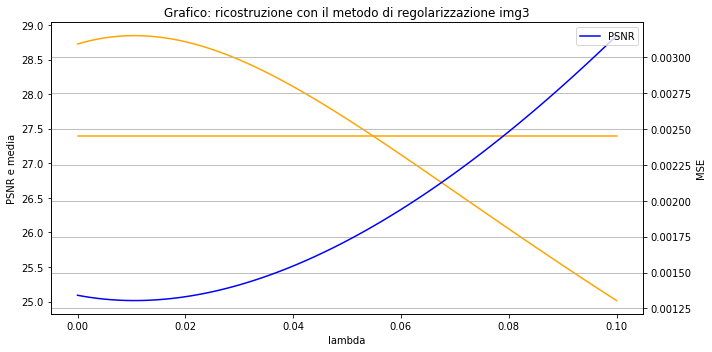

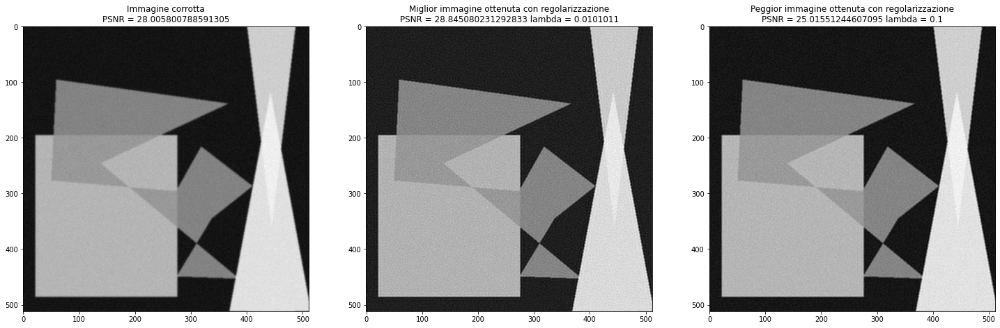

         Current function value: 40.289365
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img4 -> lambda: 1e-07 PSNR: 29.580031767786853 MSE: 0.0011015312520275692
         Current function value: 56.085596
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img4 -> lambda: 0.0010102000000000002 PSNR: 29.61983894675853 MSE: 0.0010914808120409468
         Current function value: 71.847591
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img4 -> lambda: 0.0020203 PSNR: 29.657725337504075 MSE: 0.001082000511930004
         Current function value: 87.575507
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img4 -> lambda: 0.0030304000000000004 PSNR: 29.693692822423593 MSE: 0.0010730765832234438
         Current function value: 103.269498
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13

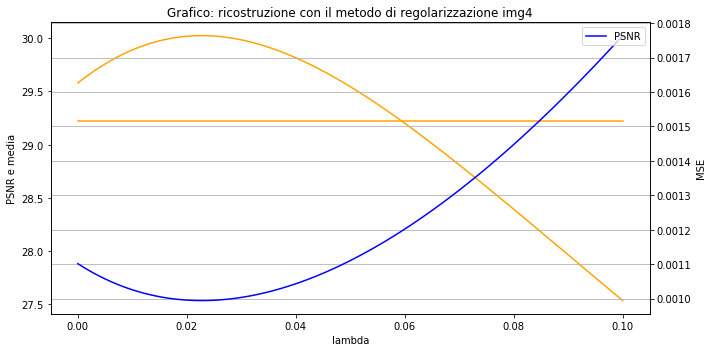

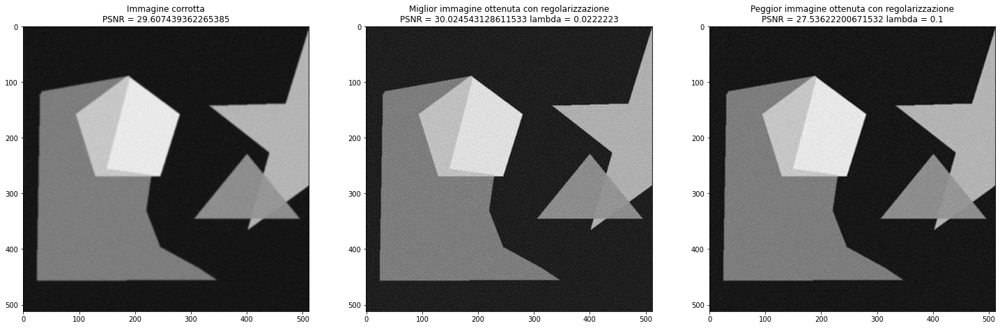

         Current function value: 40.305519
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img5 -> lambda: 1e-07 PSNR: 29.472129927072555 MSE: 0.0011292419603823264
         Current function value: 58.711809
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img5 -> lambda: 0.0010102000000000002 PSNR: 29.510007911466978 MSE: 0.001119435844208503
         Current function value: 77.078571
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img5 -> lambda: 0.0020203 PSNR: 29.545860141097542 MSE: 0.0011102326266488802
         Current function value: 95.405978
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img5 -> lambda: 0.0030304000000000004 PSNR: 29.57968712277383 MSE: 0.0011016186702040465
         Current function value: 113.694200
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13

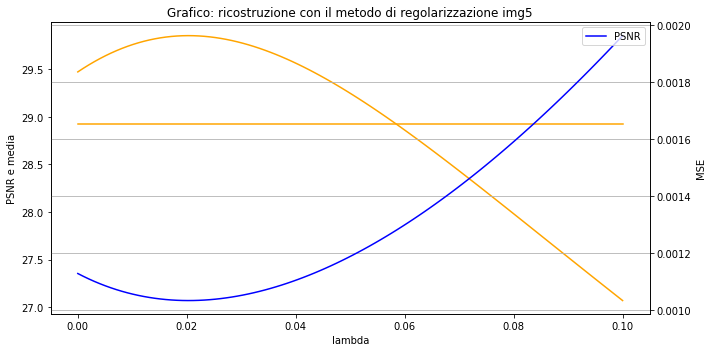

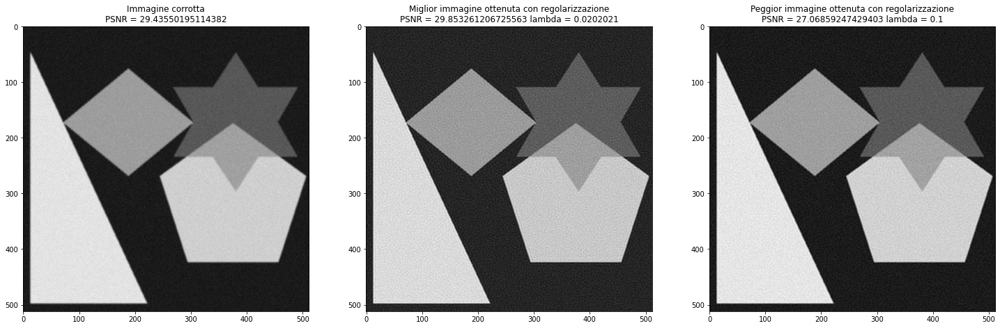

         Current function value: 40.386255
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img6 -> lambda: 1e-07 PSNR: 29.29688941555488 MSE: 0.0011757393632776541
         Current function value: 61.792935
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img6 -> lambda: 0.0010102000000000002 PSNR: 29.331655969865285 MSE: 0.001166364796019861
         Current function value: 83.154004
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img6 -> lambda: 0.0020203 PSNR: 29.364311046983268 MSE: 0.0011576276604469186
         Current function value: 104.469652
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img6 -> lambda: 0.0030304000000000004 PSNR: 29.394855156031163 MSE: 0.0011495145808808386
         Current function value: 125.740067
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 1

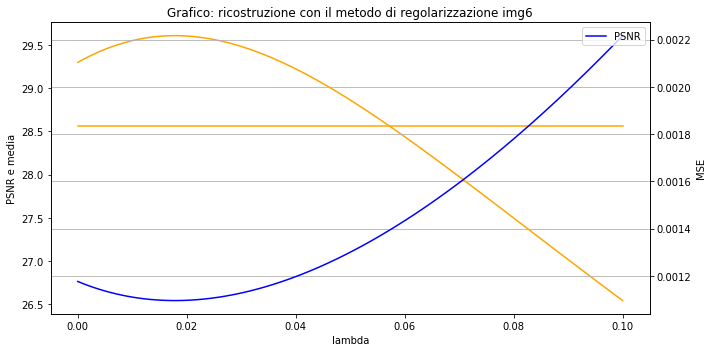

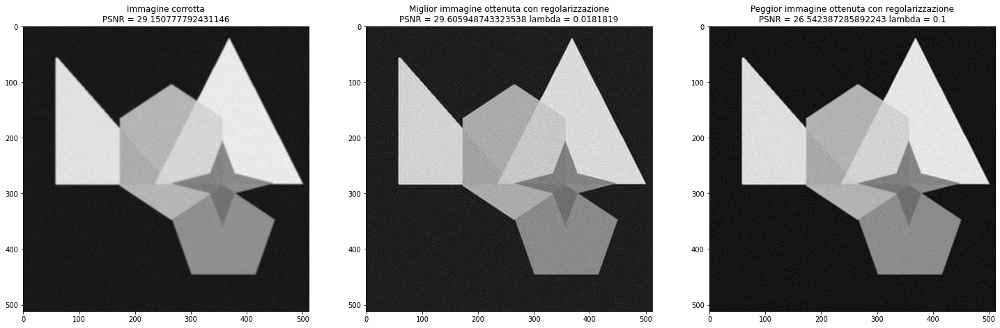

         Current function value: 40.449377
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img7 -> lambda: 1e-07 PSNR: 29.064809109584267 MSE: 0.0012402781392829728
         Current function value: 74.022615
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img7 -> lambda: 0.0010102000000000002 PSNR: 29.095560046986705 MSE: 0.0012315271631911423
         Current function value: 107.525639
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img7 -> lambda: 0.0020203 PSNR: 29.12364560876524 MSE: 0.0012235886480413682
         Current function value: 140.958711
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img7 -> lambda: 0.0030304000000000004 PSNR: 29.149062327679186 MSE: 0.00121644861210348
         Current function value: 174.322095
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 1

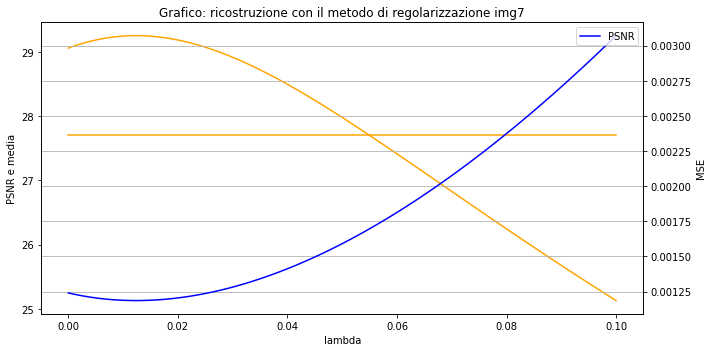

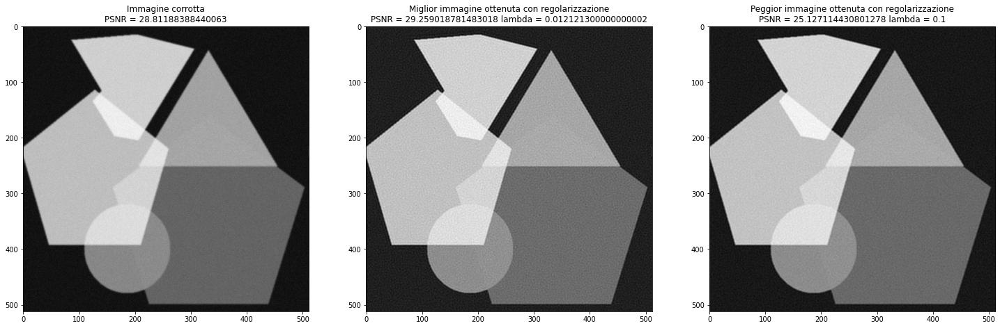

         Current function value: 40.912218
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img8 -> lambda: 1e-07 PSNR: 28.418110792715577 MSE: 0.0014394246004983946
         Current function value: 71.936533
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img8 -> lambda: 0.0010102000000000002 PSNR: 28.438558236758645 MSE: 0.001432663433441906
         Current function value: 102.895485
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img8 -> lambda: 0.0020203 PSNR: 28.45688564493416 MSE: 0.0014266302730787373
         Current function value: 133.789323
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
img8 -> lambda: 0.0030304000000000004 PSNR: 28.47310128899783 MSE: 0.0014213134672845435
         Current function value: 164.618295
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 1

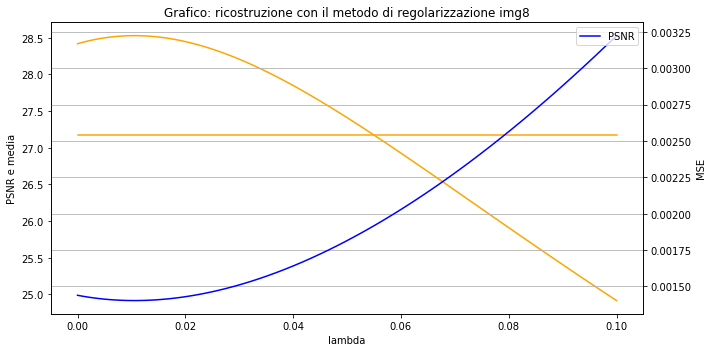

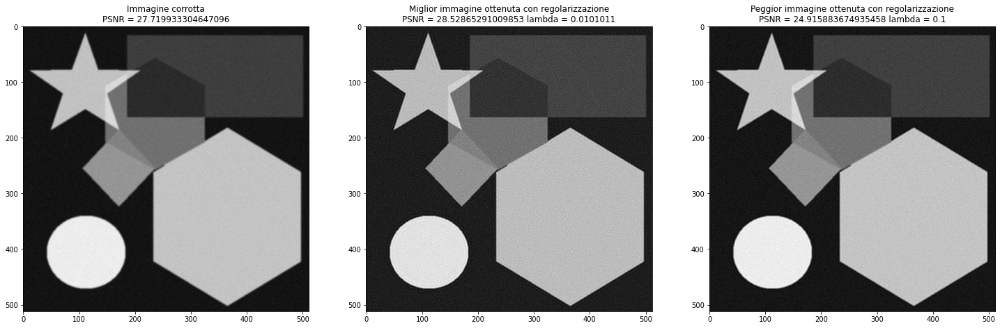

"\n  plt.plot(lista_lambda, lista_psnr, label='PSNR')\n  plt.title(f'Grafico: ricostruzione con il metodo di regolarizzazione img{alp}')\n  plt.legend(['PSNR'],'upper right')\n  plt.grid(True)\n  plt.show() \n\n  plt.plot(lista_lambda, lista_mse, label='MSE')\n  plt.title(f'Grafico: ricostruzione con il metodo di regolarizzazione img{alp}')\n  plt.legend(['MSE'],'upper right')\n  plt.grid(True)\n  plt.show()\n"

In [25]:
#! stampa per immagini geometriche
contatoreAscii = 65
labda = list(np.linspace(1e-7, 1e-1, 100))
alp=0
while alp<len(alfabetoblur):
  # lista per grafico resettati per ogni immagine
  lista_lambda = []
  lista_psnr = []
  lista_mse = []

  media_psnr=0

  massimoPSNR = [-9999, 0] #PSNR e LAMBDA
  fotoMaxPSNR = np.zeros((m,n))

  minimoPSNR = [9999, 0] #PSNR e LAMBDA
  fotoMinPSNR = np.zeros((m,n))
  
  for i in range(100):             
    func = lambda x: f(x, alfabetoblur[alp], labda[i])
    grad_func = lambda x: df(x, alfabetoblur[alp], labda[i])
    res = minimize(func, np.zeros(xx[alp].shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':5})
    RES = res.x.reshape(m,n)
    
    PSNR = metrics.peak_signal_noise_ratio(alfabeto[alp], RES)
    MSE = metrics.mean_squared_error(alfabeto[alp], RES)

    massimoPSNR[0] = max(massimoPSNR[0], PSNR)
    if massimoPSNR[0] == PSNR:
      fotoMaxPSNR = RES
      massimoPSNR[1] = labda[i]

    minimoPSNR[0] = min(minimoPSNR[0], PSNR)
    if minimoPSNR[0] == PSNR:
      fotoMinPSNR = RES
      minimoPSNR[1] = labda[i]

    media_psnr += PSNR
    
    lista_psnr.append(PSNR)
    lista_mse.append(MSE)
    lista_lambda.append(labda[i])
    print(f'img{alp+1} -> lambda: {labda[i]} PSNR: {PSNR} MSE: {MSE}')
  
  print(f'media psnr = {media_psnr/100}')
  alp+=1
  # stampa grafico
  fig, ax = plt.subplots(figsize = (10, 5))

  ax2 = ax.twinx()
  ax.plot(lista_lambda, lista_psnr, label='PSNR', color = "orange")
  ax.plot(lista_lambda, [media_psnr/100 for i in range(100)], label='media PSNR', color = "orange")
  ax2.plot(lista_lambda, lista_mse, label='MSE', color = "blue")

  plt.title(f'Grafico: ricostruzione con il metodo di regolarizzazione img{alp}')
  plt.legend(['PSNR', 'MSE'], loc='upper right')
  plt.grid()

  # giving labels to the axises
  ax.set_xlabel('lambda')
  ax.set_ylabel('PSNR e media')

  # secondary y-axis label
  ax2.set_ylabel("MSE")
 
  # defining display layout
  plt.tight_layout()
 
  # show plot
  plt.show()

  exec("immagineOriginale = " + str(chr(contatoreAscii + alp - 1)) + str(chr(contatoreAscii + alp - 1)))
  exec("immagineCorrotta = " + str(chr(contatoreAscii + alp - 1)) + str(chr(contatoreAscii + alp - 1)) + "_blur")
  plt.figure(figsize=(25, 75))
  plt.subplot(131)
  plt.title(f"Immagine corrotta\nPSNR = {metrics.peak_signal_noise_ratio(immagineOriginale, immagineCorrotta)}")
  plt.imshow(immagineCorrotta, cmap="gray")
  plt.subplot(132)
  plt.title(f"Miglior immagine ottenuta con regolarizzazione\nPSNR = {massimoPSNR[0]} lambda = {massimoPSNR[1]}")
  plt.imshow(fotoMaxPSNR, cmap="gray")
  plt.subplot(133)
  plt.title(f"Peggior immagine ottenuta con regolarizzazione\nPSNR = {minimoPSNR[0]} lambda = {minimoPSNR[1]}")
  plt.imshow(fotoMinPSNR, cmap="gray")
  plt.show()
'''
  plt.plot(lista_lambda, lista_psnr, label='PSNR')
  plt.title(f'Grafico: ricostruzione con il metodo di regolarizzazione img{alp}')
  plt.legend(['PSNR'],'upper right')
  plt.grid(True)
  plt.show() 

  plt.plot(lista_lambda, lista_mse, label='MSE')
  plt.title(f'Grafico: ricostruzione con il metodo di regolarizzazione img{alp}')
  plt.legend(['MSE'],'upper right')
  plt.grid(True)
  plt.show()
'''

         Current function value: 40.256520
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 1e-07 PSNR: 30.45080692013957  MSE: 0.0009014036410435477
         Current function value: 92.933166
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 0.0010102000000000002 PSNR: 30.498241357862614  MSE: 0.0008916119164363754
         Current function value: 145.501071
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 0.0020203 PSNR: 30.54055965730875  MSE: 0.0008829661089019161
         Current function value: 197.960623
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 0.0030304000000000004 PSNR: 30.57769411116586  MSE: 0.0008754484716772443
         Current function value: 250.312203
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 0.0040405000000000

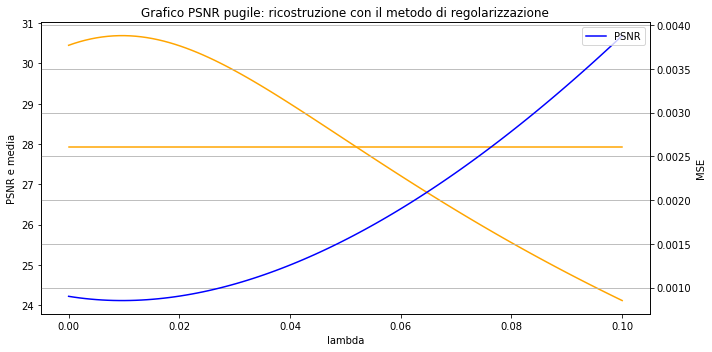

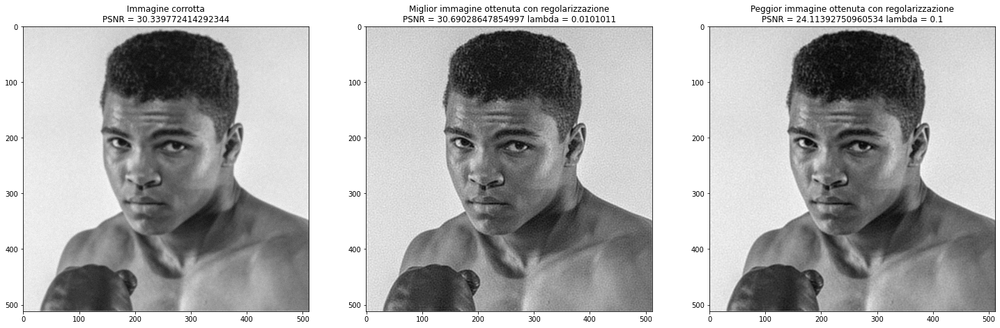

         Current function value: 50.406553
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 1e-07 PSNR: 22.16280391141727 MSE: 0.006077425011624674
         Current function value: 130.214711
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 0.0010102000000000002 PSNR: 22.158412004874585 MSE: 0.006083574061298091
         Current function value: 209.856870
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 0.0020203 PSNR: 22.152074893261275 MSE: 0.006092457533313809
         Current function value: 289.333136
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 0.0030304000000000004 PSNR: 22.14382418699385 MSE: 0.006104042957140752
         Current function value: 368.643498
         Iterations: 5
         Function evaluations: 13
         Gradient evaluations: 13
lambda: 0.004040500000000001 PSN

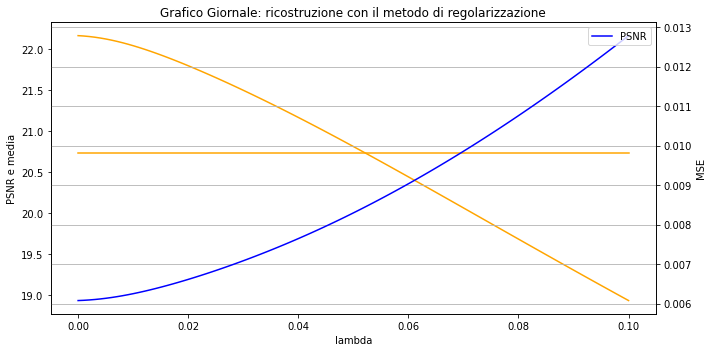

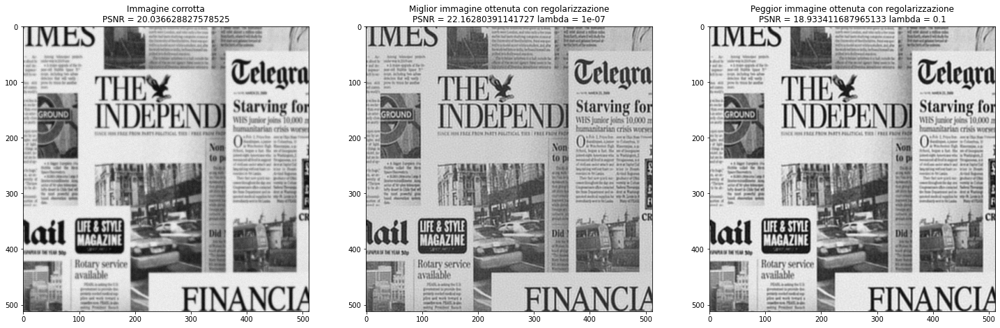

"\nplt.plot(lista_lambda, lista_psnr, label='PSNR')\nplt.plot(lista_lambda, lista_mse, label='MSE')\nplt.title('Grafico giornale: ricostruzione con il metodo di regolarizzazione')\nplt.legend(['PSNR', 'MSE'],'upper right')\nplt.grid(True)\nplt.show()\n"

In [28]:
# stampa grafico immagini fotografiche
labda = list(np.linspace(1e-7, 1e-1, 100))
# lista per grafico 
lista_lambda = []
lista_psnr = []
lista_mse = []

media_psnr=0

massimoPSNR = [-9999, 0] #PSNR e LAMBDA
fotoMaxPSNR = np.zeros((m,n))

minimoPSNR = [9999, 0] #PSNR e LAMBDA
fotoMinPSNR = np.zeros((m,n))
#pugile.png
for i in range(100): 
  func = lambda x: f(x, II_blur, labda[i])
  grad_func = lambda x: df(x, II_blur, labda[i])
  res = minimize(func, np.zeros(ii_blur.shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':5})
  RES = res.x.reshape(m,n)

  PSNR = metrics.peak_signal_noise_ratio(II, RES)
  MSE = metrics.mean_squared_error(II, RES)

  massimoPSNR[0] = max(massimoPSNR[0], PSNR)
  if massimoPSNR[0] == PSNR:
    fotoMaxPSNR = RES
    massimoPSNR[1] = labda[i]

  minimoPSNR[0] = min(minimoPSNR[0], PSNR)
  if minimoPSNR[0] == PSNR:
    fotoMinPSNR = RES
    minimoPSNR[1] = labda[i]
  
  media_psnr += PSNR
  lista_psnr.append(PSNR)
  lista_mse.append(MSE)
  lista_lambda.append(labda[i])
  print(f'lambda: {labda[i]} PSNR: {PSNR}  MSE: {MSE}')

# stampa grafico

fig, ax = plt.subplots(figsize = (10, 5))

ax2 = ax.twinx()
ax.plot(lista_lambda, lista_psnr, label='PSNR', color = "orange")
ax.plot(lista_lambda, [media_psnr/100 for i in range(100)], label='media PSNR', color = "orange")
ax2.plot(lista_lambda, lista_mse, label='MSE', color = "blue")

plt.title('Grafico PSNR pugile: ricostruzione con il metodo di regolarizzazione')
plt.legend(['PSNR', 'MSE'], loc='upper right')
plt.grid()

# giving labels to the axises
ax.set_xlabel('lambda')
ax.set_ylabel('PSNR e media')

# secondary y-axis label
ax2.set_ylabel("MSE")
 
# defining display layout
plt.tight_layout()
 
# show plot
plt.show()

'''
plt.plot(lista_lambda, lista_psnr, label='PSNR')
plt.plot(lista_lambda, lista_mse, label='MSE')
plt.title('Grafico PSNR pugile: ricostruzione con il metodo di regolarizzazione')
plt.legend(['PSNR', 'MSE'],'upper right')
plt.grid(True)
plt.show()
'''


plt.figure(figsize=(25, 75))
plt.subplot(131)
plt.title(f"Immagine corrotta\nPSNR = {metrics.peak_signal_noise_ratio(II, II_blur)}")
plt.imshow(II_blur, cmap="gray")
plt.subplot(132)
plt.title(f"Miglior immagine ottenuta con regolarizzazione\nPSNR = {massimoPSNR[0]} lambda = {massimoPSNR[1]}")
plt.imshow(fotoMaxPSNR, cmap="gray")
plt.subplot(133)
plt.title(f"Peggior immagine ottenuta con regolarizzazione\nPSNR = {minimoPSNR[0]} lambda = {minimoPSNR[1]}")
plt.imshow(fotoMinPSNR, cmap="gray")
plt.show()








# lista per grafico 
lista_lambda = []
lista_psnr = []
lista_mse = []

media_psnr=0

massimoPSNR = [-9999, 0] #PSNR e LAMBDA
fotoMaxPSNR = np.zeros((m,n))

minimoPSNR = [9999, 0] #PSNR e LAMBDA
fotoMinPSNR = np.zeros((m,n))

#giornale.png
for i in range(100): 
  func = lambda x: f(x, LL_blur, labda[i])
  grad_func = lambda x: df(x, LL_blur, labda[i])
  res = minimize(func, np.zeros(ll_blur.shape), method="CG", jac=grad_func, options={'disp': True, 'maxiter':5})
  RES = res.x.reshape(m,n)

  PSNR = metrics.peak_signal_noise_ratio(LL, RES)
  MSE = metrics.mean_squared_error(LL, RES)

  massimoPSNR[0] = max(massimoPSNR[0], PSNR)
  if massimoPSNR[0] == PSNR:
    fotoMaxPSNR = RES
    massimoPSNR[1] = labda[i]

  minimoPSNR[0] = min(minimoPSNR[0], PSNR)
  if minimoPSNR[0] == PSNR:
    fotoMinPSNR = RES
    minimoPSNR[1] = labda[i]
  
  media_psnr += PSNR
  lista_psnr.append(PSNR)
  lista_mse.append(MSE)
  lista_lambda.append(labda[i])
  print(f'lambda: {labda[i]} PSNR: {PSNR} MSE: {MSE}')

# stampa grafico

fig, ax = plt.subplots(figsize = (10, 5))

ax2 = ax.twinx()
ax.plot(lista_lambda, lista_psnr, label='PSNR', color = "orange")
ax.plot(lista_lambda, [media_psnr/100 for i in range(100)], label='media PSNR', color = "orange")
ax2.plot(lista_lambda, lista_mse, label='MSE', color = "blue")

plt.title('Grafico Giornale: ricostruzione con il metodo di regolarizzazione')
plt.legend(['PSNR', 'MSE'], loc='upper right')
plt.grid()

# giving labels to the axises
ax.set_xlabel('lambda')
ax.set_ylabel('PSNR e media')

# secondary y-axis label
ax2.set_ylabel("MSE")
 
# defining display layout
plt.tight_layout()
 
# show plot
plt.show()


plt.figure(figsize=(25, 75))
plt.subplot(131)
plt.title(f"Immagine corrotta\nPSNR = {metrics.peak_signal_noise_ratio(LL, LL_blur)}")
plt.imshow(LL_blur, cmap="gray")
plt.subplot(132)
plt.title(f"Miglior immagine ottenuta con regolarizzazione\nPSNR = {massimoPSNR[0]} lambda = {massimoPSNR[1]}")
plt.imshow(fotoMaxPSNR, cmap="gray")
plt.subplot(133)
plt.title(f"Peggior immagine ottenuta con regolarizzazione\nPSNR = {minimoPSNR[0]} lambda = {minimoPSNR[1]}")
plt.imshow(fotoMinPSNR, cmap="gray")
plt.show()

'''
plt.plot(lista_lambda, lista_psnr, label='PSNR')
plt.plot(lista_lambda, lista_mse, label='MSE')
plt.title('Grafico giornale: ricostruzione con il metodo di regolarizzazione')
plt.legend(['PSNR', 'MSE'],'upper right')
plt.grid(True)
plt.show()
'''

In [ ]:
#DA FARE RICOSTRUZIONE CON GRADIENTE 

labda = list(np.linspace(1e-7, 1e-4, 100))
for i in range(100):
  z_tikhonov = gradient_minimize(B, labda[i], maxit = 27)
  PSNR = metrics.peak_signal_noise_ratio(X, z_tikhonov.reshape(m,n))
  print(f'lambda: {labda[i]} PSNR: {PSNR}')

In [ ]:
#DA FARE RICOSTRUZIONE CON GRADIENTE 

#! stampa immagini geometriche ripristinate
alp=0
while alp<len(alfabetoblur):
  for i in range(17):
    z_tikhonov = gradient_minimize(alfabetoblur[alp], labda[i])
    PSNR = metrics.peak_signal_noise_ratio(alfabeto[alp], z_tikhonov.reshape(m,n))
    
    #if alp==0:
      #print(f'data.camera() -> lambda: {labda[i]} PSNR: {PSNR}')
    #else:
    print(f'img{alp} -> lambda: {labda[i]} PSNR: {PSNR}') #data camera corrotta (=B) l'abbiamo analizzata sopra
  alp+=1

## 4) Variazione Totale (Facoltativo) 

Un altra funzione adatta come termine di regolarizzazione è la Variazione Totale. Data $u$ immagine di dimensioni $m\times n$ la variazione totale $TV$ di $u$ è definit come:
\begin{align*}
  TV(u) = \sum_i^n{\sum_j^m{\sqrt{||\nabla u(i, j)||_2^2 + \epsilon^2}}}
\end{align*}
Per calcolare il gradiente dell'immagine $\nabla u$ usiamo la funzione `np.gradient` che approssima la derivata per ogni pixel calcolando la differenza tra pixel adiacenti. I risultati sono due immagini della stessa dimensione dell'immagine in input, una che rappresenta il valore della derivata orizzontale `dx` e l'altra della derivata verticale `dy`. Il gradiente dell'immagine nel punto $(i, j)$ è quindi un vettore di due componenti, uno orizzontale contenuto in `dx` e uno verticale in `dy`.

Come nei casi precedenti il problema di minimo che si va a risolvere è il seguente:
\begin{align*}
  x^* = \arg\min_x \frac{1}{2} ||Ax - b||_2^2 + \lambda TV(u)
\end{align*}
il cui gradiente $\nabla f$ è dato da
\begin{align*}
\nabla f(x) = (A^TAx - A^Tb)  + \lambda \nabla TV(x)
\end{align*}

Utilizzando il metodo del gradiente implementato a lezione, calcolare la soluzione del precendente problema di minimo regolarizzato per differenti valori di $\lambda$. 


---
Per risolvere il problema di minimo è necessario anche calcolare il gradiente della variazione totale che è definito nel modo seguente
\begin{align*}
  \nabla TV(u) = -div\left(\frac{\nabla u}{\sqrt{||\nabla u||_2^2 + \epsilon^2}}\right)
\end{align*}

\begin{align*}
  div(F) = \frac{\partial F_x}{\partial x} + \frac{\partial F_y}{\partial y}
\end{align*}

$div(F)$ è la divergenza del campo vettoriale $F$, nel nostro caso $F$ ha due componenti dati dal gradiente dell'immagine $\nabla u$ scalato per il valore $ \frac{1}{\sqrt{||\nabla u||_2^2 + \epsilon^2}}$. Per calcolare la divergenza bisogna calcolare la derivata orizzontale $\frac{\partial F_x}{\partial x}$ della componente $x$ di $F$ e sommarla alla derivata verticale $\frac{\partial F_y}{\partial y}$ della componente $y$ di $F$. Per specificare in quale direzione calcolare la derivata con la funzione `np.gradient` utilizziamo il parametro `axis = 0` per l'orizzontale e `axis = 1` per la verticale.

In [29]:
eps = 1e-2

# Variazione totale
def totvar(x):
  # Calcola il gradiente di x
  dx, dy = np.gradient(x)
  n2 = np.square(dx) + np.square(dy)

  # Calcola la variazione totale di x
  tv = np.sqrt(n2 + eps**2).sum()
  return tv

# Gradiente della variazione totale
def grad_totvar(x):
  # Calcola il numeratore della frazione
  dx, dy = np.gradient(x)

  # Calcola il denominatore della frazione
  n2 = np.square(dx) + np.square(dy)
  den = np.sqrt(n2 + eps**2)

  # Calcola le due componenti di F dividendo il gradiente per il denominatore
  Fx = dx / den
  Fy = dy / den

  # Calcola la derivata orizzontale di Fx 
  dFdx = np.gradient(Fx, axis=0)
  
  # Calcola la derivata verticale di Fy
  dFdy = np.gradient(Fy, axis=1)

  # Calcola la divergenza 
  div = (dFdx + dFdy)

  # Restituisci il valore del gradiente della variazione totale
  return -div

In [30]:
def f_tv(x, B, labda):
  X = x.reshape(m,n)
  res = 0.5*(np.linalg.norm(A(X, K)-B))**2 + labda*totvar(X)
  return np.sum(res)
def df_tv(x, B, labda):
  X = x.reshape(m,n)
  res = AT(A(X, K)-B, K) + labda*grad_totvar(X)
  RES = np.reshape(res, m*n)
  return RES
def next_step_tv(x,grad, B, labda): # backtracking procedure for the choice of the steplength
  alpha=1.1
  c1 = 0.25
  p=-grad
  j=0
  jmax=10
  #condizioni che servono per soddisfare dei criteri di convergenza - condizioni di Wolfe
  while ((f_tv(x + alpha*p, B, labda) > f_tv(x, B, labda)+c1*alpha*grad.T@p) and j<jmax):
    alpha= alpha*0.5
    j+=1
  return alpha
def gradient_minimize_tv(B, labda, maxit=27, abstop = 1.e-6):
  x_last = x0=np.zeros(m*n)
  k = 0
  while (np.linalg.norm(df_tv(x_last, B, labda))>abstop and k < maxit):
    k=k+1
    grad = df_tv(x_last, B, labda)
    step = next_step_tv(x_last, grad, B, labda)
    x_last=x_last-step*grad
  return x_last

sto analizzando immagine II_blur. lambda: 1e-05 PSNR: 29.25 MSE: 0.0011875524877092984 Errore relativo: 0.05463252270551105
sto analizzando immagine II_blur. lambda: 0.00014416107382550337 PSNR: 29.59 MSE: 0.0010989320142957074 Errore relativo: 0.05255454261952949
sto analizzando immagine II_blur. lambda: 0.0002783221476510068 PSNR: 29.92 MSE: 0.00101955118667748 Errore relativo: 0.050620842064977814
sto analizzando immagine II_blur. lambda: 0.00041248322147651015 PSNR: 30.23 MSE: 0.0009486883967049698 Errore relativo: 0.04882999079725959
sto analizzando immagine II_blur. lambda: 0.0005466442953020135 PSNR: 30.53 MSE: 0.0008856293652441927 Errore relativo: 0.0471792303848148
sto analizzando immagine II_blur. lambda: 0.0006808053691275169 PSNR: 30.81 MSE: 0.0008296763250403621 Errore relativo: 0.045664551531701326
sto analizzando immagine II_blur. lambda: 0.0008149664429530203 PSNR: 31.08 MSE: 0.0007801565029847963 Errore relativo: 0.044280826103211
sto analizzando immagine II_blur. lam

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: UserWarning: Legend does not support 'P' instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: UserWarning: Legend does not support 'S' instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: UserWarning: Legend does not support 'N' instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists


<Figure size 432x288 with 0 Axes>

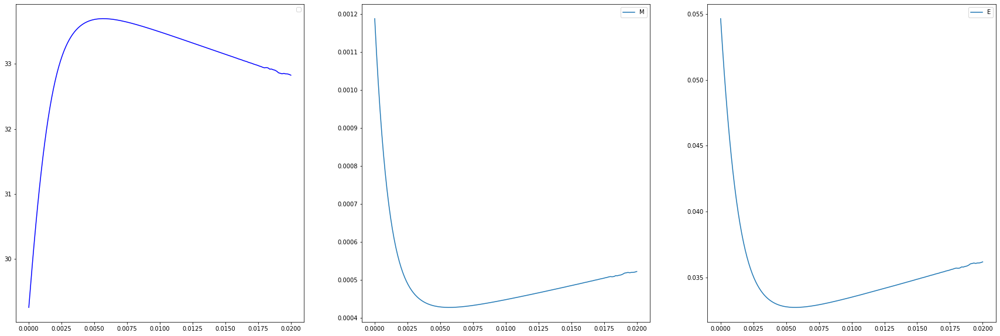

<Figure size 432x288 with 0 Axes>

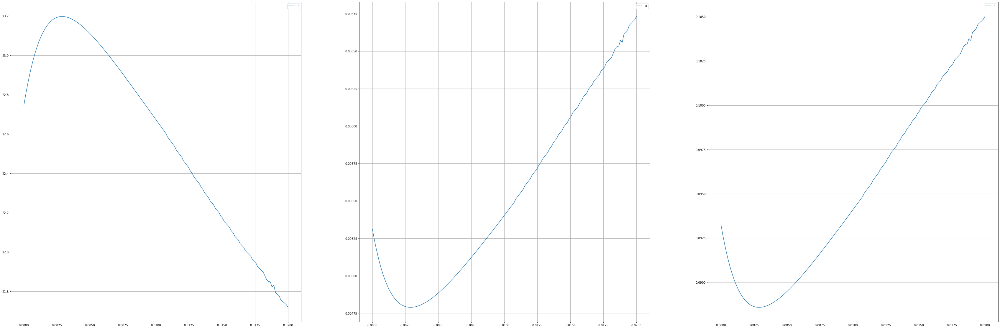

<Figure size 432x288 with 0 Axes>

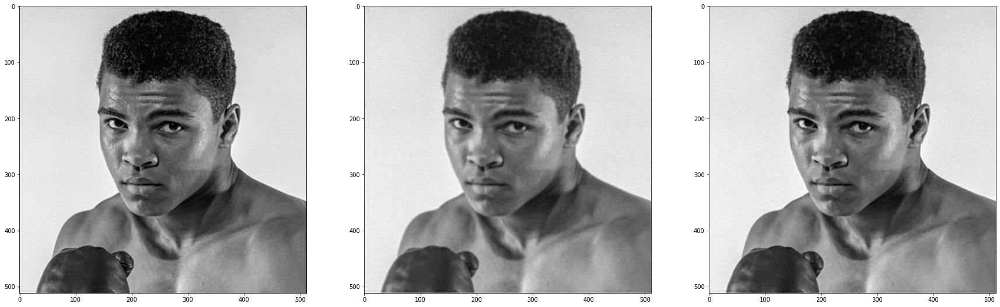

<Figure size 432x288 with 0 Axes>

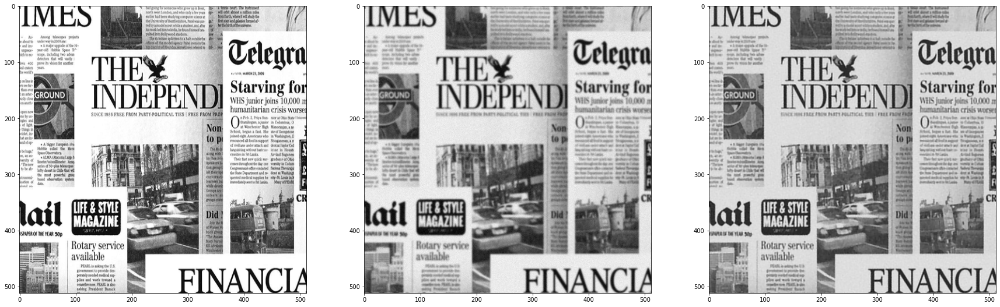

In [41]:

labda = list(np.linspace(0.00001, 0.02, 150))
immaginiCorrotteLista = [II_blur,  LL_blur] #le immagini corrotte sono quelle del tipo X_blur + noise
immaginiPuliteLista = [II, LL] #sono le immagini pulite

#per ogni immagine
listaPSNR_II = []
listaMSE_II = []
listaERRREL_II = []
massimoPSNR_II = [-9999, 0] #PSNR e LAMBDA
fotoMaxPSNR_II = np.zeros((m,n))

listaPSNR_LL = []
listaMSE_LL = []
listaERRREL_LL = []
massimoPSNR_LL = [-9999, 0] #PSNR e LAMBDA
fotoMaxPSNR_LL = np.zeros((m,n))

for j in range(len(immaginiCorrotteLista)):
  for i in range(150):
    ricostruzione_tv = gradient_minimize_tv(immaginiCorrotteLista[j], labda[i])
    RICOSTRUZIONE_tv = ricostruzione_tv.reshape(m,n) #per convenzione abbiamo usato che le variabili in minuscolo sono vettori di dimensione m*n mentre le variabili in MAIUSCOLO sono MATRICI di dimensione (m,n)
    PSNR = metrics.peak_signal_noise_ratio(immaginiPuliteLista[j], RICOSTRUZIONE_tv) #primo argomento immagine pulita, secondo argomento l'immagine ricostruita col metodo che stiamo utilizzando attualmente
    MSE = metrics.mean_squared_error(immaginiPuliteLista[j], RICOSTRUZIONE_tv)
    erroreRelativo = np.linalg.norm(RICOSTRUZIONE_tv - immaginiPuliteLista[j], 'fro')/np.linalg.norm(immaginiPuliteLista[j], 'fro') #errore relativo in norma di frobenius. Gli altri progetto mi ricordo che utilizzavano questa

    #per ogni immagine
    if (immaginiCorrotteLista[j] is II_blur):
      listaPSNR_II.append(PSNR)
      listaMSE_II.append(MSE)
      listaERRREL_II.append(erroreRelativo)
      massimoPSNR_II[0] = max(massimoPSNR_II[0], PSNR)
      if massimoPSNR_II[0] == PSNR:
        massimoPSNR_II[1] = labda[i]
        fotoMaxPSNR_II = RICOSTRUZIONE_tv
      print(f'sto analizzando immagine II_blur. lambda: {labda[i]} PSNR: {PSNR:.2f} MSE: {MSE} Errore relativo: {erroreRelativo}')
    
    #per tutte le immagini. L'importante non è divertirsi ma il meschino voto/risultato
    elif immaginiCorrotteLista[j] is LL_blur:
      listaPSNR_LL.append(PSNR)
      listaMSE_LL.append(MSE)
      listaERRREL_LL.append(erroreRelativo)
      massimoPSNR_LL[0] = max(massimoPSNR_LL[0], PSNR)
      if massimoPSNR_LL[0] == PSNR:
        massimoPSNR_LL[1] = labda[i]
        fotoMaxPSNR_LL = RICOSTRUZIONE_tv
      print(f'sto analizzando immagine LL_blur. lambda: {labda[i]} PSNR: {PSNR:.2f} MSE: {MSE} Errore relativo: {erroreRelativo}')


#dopo che ho ottenuto le mie liste sono pronto a plottare (sempre per ogni immagine)
for j in range(len(immaginiCorrotteLista)):
  #per ogni immagine
  if (immaginiCorrotteLista[j] is II_blur): 
    plt.suptitle("STO ANALIZZANDO RICOSTRUZIONE RIGUARDO II (II_blur ERA LA SUA CORROTTA")
    plt.figure(figsize=(30,10))
    plt.subplot(1,3,1)
    plt.plot(labda, listaPSNR_II, 'r', color="blue") #r di retta, togliere il  durante relazione messo per fare prima test
    plt.legend("PSNR", "MSE") #accetta al massimo due
    plt.subplot(1,3,2)
    plt.plot(labda, listaMSE_II) 
    plt.legend("MSE")
    plt.subplot(1,3,3)
    plt.plot(labda, listaERRREL_II) 
    plt.legend("ERRORE RELATIVO")
    plt.show()
  
  elif immaginiCorrotteLista[j] is LL_blur:
    plt.suptitle("STO ANALIZZANDO RICOSTRUZIONE RIGUARDO LL (LL_blur ERA LA SUA CORROTTA")
    plt.figure(figsize=(60,20))
    plt.subplot(1,3,1)
    plt.plot(labda, listaPSNR_LL)
    plt.grid()
    plt.legend("PSNR")
    plt.subplot(1,3,2)
    plt.plot(labda, listaMSE_LL) 
    plt.grid()
    plt.legend("MSE")
    plt.subplot(1,3,3)
    plt.plot(labda, listaERRREL_LL) 
    plt.grid()
    plt.legend("ERRORE RELATIVO")
    plt.show()

plt.suptitle("ORIGINALE, CORROTTA, RICOSTRUITA PUGILE")
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(II, cmap="gray")
plt.subplot(1,3,2)
plt.imshow(II_blur, cmap="gray")
plt.subplot(1,3,3)
plt.imshow(fotoMaxPSNR_II, cmap="gray")
plt.show()

plt.suptitle("ORIGINALE, CORROTTA, RICOSTRUITA GIORNALE")
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(LL, cmap="gray")
plt.subplot(1,3,2)
plt.imshow(LL_blur, cmap="gray")
plt.subplot(1,3,3)
plt.imshow(fotoMaxPSNR_LL, cmap="gray")
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


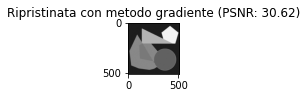

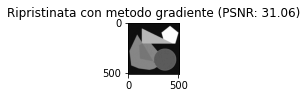

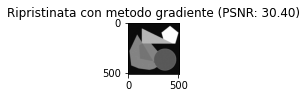

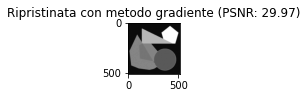

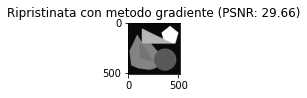

...

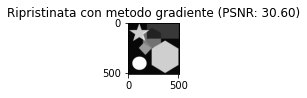

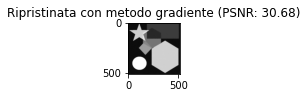

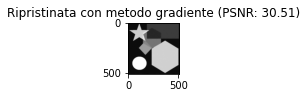

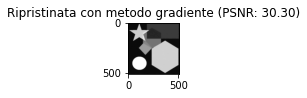

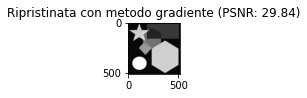

In [42]:
#! stampa immagini geometriche ripristinate ?
alp=0
labda = list(np.linspace(0.0025, 0.1, 10)) #da punto di maggior psnr
while alp<len(alfabetoblur):
  for i in range(10):                 #! risettare il range a 50, ho messo 10 per fare prima, ci metteva troppo tempo
    z_tv = gradient_minimize_tv(alfabetoblur[alp], labda[i])
    PSNR = metrics.peak_signal_noise_ratio(alfabeto[alp], z_tv.reshape(m,n))
    #print(f'lambda: {labda[i]} PSNR: {PSNR:.2f}')
    plt.figure(figsize=(30,10))
    plt.subplot(9,10,i+1).imshow(z_tv.reshape(m,n), cmap="gray")
    plt.title(f'Ripristinata con metodo gradiente (PSNR: {PSNR:.2f})')
  alp+=1

# Relazione

1.   Riportare e commentare i risultati ottenuti nei punti 2. 3. (e 4.) su un immagine del set creato e su altre due immagini in bianco e nero  (fotografiche/mediche/astronomiche)
2.   Riportare delle tabelle con le misure di PSNR e MSE ottenute al variare dei parametri (dimensione kernel, valore di sigma, la deviazione standard del rumore, il parametro di regolarizzazione). 
3. Calcolare sull’intero set di immagini medie e deviazione standard delle metriche per alcuni valori fissati dei parametri.  
4. Analizzare su 2 esecuzioni le proprietà dei metodi numerici utilizzati (gradiente coniugato e gradiente) in termini di numero di iterazioni, andamento dell’errore, della funzione obiettivo, norma del gradiente. 

